##  Foundation Model Verification

This script verifies output from a ML-based foundation model versus a
traditional NWP system for the atmospheric system. The defaults set at the top of
this script are tailored to the Alps-Tödi HPC system at CSCS.  Currently, the
focus is on reconstrunctions created by the ML-model, but the script can be
easily adapted to other use cases (e.g. forecasting, downscaling).

**Enter all your user settings in the cell below.**

In [ ]:
### DEFAULTS ###
# This config will be applied to the data before any plotting. The data will be
# sliced and indexed according to the values in this config.

# Path to the Ground Truth data (in zarr format!)
PATH_NWP = "/capstor/store/cscs/ERA5/weatherbench2_original"
# Path to the ml model data (in zarr format!)
PATH_ML = "/iopsstor/scratch/cscs/sadamov/pyprojects_data/swissai/preds_20250219/aurora.zarr"
# Selection of vertical levels
LEVELS = [50, 100, 150, 200, 250, 300, 400, 500, 600, 700, 850, 925, 1000]
# Temporal resolution in hours.
TEMPORAL_RESOLUTION = 1
# Selection of time steps (e.g. ["2021-01-01T06", "2021-01-05T00"], or [None,
# None])
DATETIMES = ["2021-01-01T12", "2021-02-01T06"]
# Selection of latitude and longitude
LATITUDES = [90.0, -89.75]
LONGITUDES = [0.0, 359.75]
# Variables to be plotted, 2D and 3D variables are treated separately
# Dims - 2D: time, latitude, longitude; 3D: time, latitude, longitude, level
VARIABLES_2D = [
    "10m_u_component_of_wind",
    "10m_v_component_of_wind",
    "2m_temperature",
    "mean_sea_level_pressure",
]
VARIABLES_3D = [
    "geopotential",
    "specific_humidity",
    "temperature",
    "u_component_of_wind",
    "v_component_of_wind",
]
# If the model has probabilistic output, choose one member here
# Otherwise the setting will be ignored. In the future probabilistic
# verification will be implemented.
ENSEMBLE_MEMBER = 0
# Usually model data has no missing values, but if it might, set this to True
CHECK_MISSING_VALUES = False
# For some plots a random time step sample is selected
RANDOM_SEED = 42
TIME_SUBSAMPLES = 10
DPI = 48

In [6]:
import random

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from dask.distributed import LocalCluster, Client
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
from scipy.stats import gaussian_kde, wasserstein_distance
from scores.continuous import (
    mae,
    mse,
    rmse,
)
from scores.continuous.correlation import pearsonr
from scores.spatial import fss_2d
from scores.categorical import BinaryContingencyManager
from pysteps.verification.salscores import sal

Loading ERA5 weatherbench data, originally stored in a Google Cloud Bucket, it
is already available on Alps. The content must match the config defined in the
first code cell.

Uncomment the localCluster to eagerly calculate and load the entire dataset into memory. Takes a long time but consequent cells will be faster thanks to the caching mechanism.

In [ ]:
# with LocalCluster(
#     n_workers=32, threads_per_worker=1, memory_limit="8GB"
# ) as cluster:
#     with Client(cluster) as client:
ds = xr.open_zarr(PATH_NWP)
ds = ds.sel(
    level=LEVELS,
    latitude=slice(*LATITUDES),
    longitude=slice(*LONGITUDES),
    time=slice(*DATETIMES),
)
if "ensemble" in ds.dims:
    ds = ds.isel(ensemble=ENSEMBLE_MEMBER)
ds = ds[VARIABLES_2D + VARIABLES_3D]
ds_timestep = int(
    (ds.time.isel(time=1) - ds.time.isel(time=0)).dt.total_seconds() / 3600
)
ds_timestep_factor = TEMPORAL_RESOLUTION // ds_timestep
ds = ds.isel(time=slice(None, None, ds_timestep_factor))
# ds.compute()
ds

<xarray.Dataset> Size: 211GB
Dimensions:                  (time: 739, latitude: 720, longitude: 1440,
                              level: 13)
Coordinates:
  * latitude                 (latitude) float32 3kB 90.0 89.75 ... -89.5 -89.75
  * level                    (level) int64 104B 50 100 150 200 ... 850 925 1000
  * longitude                (longitude) float32 6kB 0.0 0.25 ... 359.5 359.8
  * time                     (time) datetime64[ns] 6kB 2021-01-01T12:00:00 .....
Data variables:
    10m_u_component_of_wind  (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    10m_v_component_of_wind  (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    2m_temperature           (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    mean_sea_level_pressure  (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    geopotential             (time, level, latitude, longitude) float32 40GB dask.array<chunksize=(1, 13, 720, 1440), meta=np.ndarray>
    specific_humidity        (time, level, latitude, longitude) float32 40GB dask.array<chunksize=(1, 13, 720, 1440), meta=np.ndarray>
    temperature              (time, level, latitude, longitude) float32 40GB dask.array<chunksize=(1, 13, 720, 1440), meta=np.ndarray>
    u_component_of_wind      (time, level, latitude, longitude) float32 40GB dask.array<chunksize=(1, 13, 720, 1440), meta=np.ndarray>
    v_component_of_wind      (time, level, latitude, longitude) float32 40GB dask.array<chunksize=(1, 13, 720, 1440), meta=np.ndarray>

Loading the ML-model output, expecting to have the same dimensions as the
ERA5 data. The content must match the config defined in the first code cell.

In [ ]:
# with LocalCluster(
#     n_workers=32, threads_per_worker=1, memory_limit="8GB"
# ) as cluster:
#     with Client(cluster) as client:
ds_ml = xr.open_zarr(PATH_ML)
ds_ml = ds_ml.sel(
    level=LEVELS,
    latitude=slice(*LATITUDES),
    longitude=slice(*LONGITUDES),
    time=slice(*DATETIMES),
)
if "ensemble" in ds_ml.dims:
    ds_ml = ds_ml.sel(ensemble=ENSEMBLE_MEMBER)
ds_ml = ds_ml[VARIABLES_2D + VARIABLES_3D]
if len(ds.time) > 1:
    ds_ml_timestep = int(
        (ds.time.isel(time=1) - ds.time.isel(time=0)).dt.total_seconds() / 3600
    )
    ds_ml_timestep_factor = TEMPORAL_RESOLUTION // ds_ml_timestep
    ds_ml = ds_ml.isel(time=slice(None, None, ds_ml_timestep_factor))
elif len(ds.time) == 1:
    pass
else:
    raise ValueError("No time stepts selected between the given dates.")
# ds_ml.compute()
ds_ml

<xarray.Dataset> Size: 211GB
Dimensions:                  (time: 739, latitude: 720, longitude: 1440,
                              level: 13)
Coordinates:
  * latitude                 (latitude) float32 3kB 90.0 89.75 ... -89.5 -89.75
  * level                    (level) int64 104B 50 100 150 200 ... 850 925 1000
  * longitude                (longitude) float32 6kB 0.0 0.25 ... 359.5 359.8
  * time                     (time) datetime64[ns] 6kB 2021-01-01T12:00:00 .....
Data variables:
    10m_u_component_of_wind  (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    10m_v_component_of_wind  (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    2m_temperature           (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    mean_sea_level_pressure  (time, latitude, longitude) float32 3GB dask.array<chunksize=(1, 720, 1440), meta=np.ndarray>
    geopotential             (time, level, latitude, longitude) float32 40GB dask.array<chunksize=(1, 13, 720, 1440), meta=np.ndarray>
    specific_humidity        (time, level, latitude, longitude) float32 40GB dask.array<chunksize=(1, 13, 720, 1440), meta=np.ndarray>
    temperature              (time, level, latitude, longitude) float32 40GB dask.array<chunksize=(1, 13, 720, 1440), meta=np.ndarray>
    u_component_of_wind      (time, level, latitude, longitude) float32 40GB dask.array<chunksize=(1, 13, 720, 1440), meta=np.ndarray>
    v_component_of_wind      (time, level, latitude, longitude) float32 40GB dask.array<chunksize=(1, 13, 720, 1440), meta=np.ndarray>

In [37]:
if CHECK_MISSING_VALUES:
    for var in ds.data_vars:
        missing = ds[var].isnull().sum().values
        print(f"{var}: {missing} missing values")

    for var in ds_ml.data_vars:
        missing = ds[var].isnull().sum().values
        print(f"{var}: {missing} missing values")

In [43]:
assert ds.sizes == ds_ml.sizes, (
    "Dimensions do not match. Please make sure that both datasets contain the\n"
    "exact same dimensions with the same names, the same order and the same length."
    " Currently the sizes are: \n"
    f"ERA5: {ds.sizes}\n"
    f"Aurora: {ds_ml.sizes}"
)

assert [
    "time",
    "latitude",
    "longitude",
    "level",
] == list(ds.sizes.keys()), (
    "Please make sure that both datasets contains exactly the dimensions "
    "'time', 'latitude', 'longitude' and 'level',. Currently the dimensions are: \n"
    f"ERA5: {list(ds.sizes.keys())}\n"
    f"Aurora: {list(ds_ml.sizes.keys())}"
)

In [44]:
assert ds.data_vars.keys() == ds_ml.data_vars.keys(), (
    "Variables do not match. Please make sure that both datasets contain the\n"
    "exact same variables with the same names. Currently the variables are: \n"
    f"ERA5: {ds.data_vars.keys()}\n"
    f"Aurora: {ds_ml.data_vars.keys()}"
)

In [45]:
# Subsample time steps
if TIME_SUBSAMPLES is not None:
    random.seed(RANDOM_SEED)
    n_samples = int(TIME_SUBSAMPLES)
    time_indices = random.sample(range(len(ds.time)), n_samples)
    ds = ds.isel(time=time_indices)
    ds_ml = ds_ml.isel(time=time_indices)

In [47]:
# Some plots and metrics will be based on the standardized data
# The normalization is done based on the combined data of both datasets
# This allows for different extremes in the datasets (i.e. distribution tails)
with LocalCluster(
    n_workers=32, threads_per_worker=1, memory_limit="8GB"
) as cluster:
    with Client(cluster) as client:
        combined_data = xr.concat([ds, ds_ml], dim="time")

        mean = combined_data.mean()
        std = combined_data.std()

        # Normalize both datasets
        ds_standardized = (ds - mean) / std
        ds_ml_standardized = (ds_ml - mean) / std

In [48]:
# Some plots are a mosaic of different latitude bands. By default the whole
# globe is plotted (-90° to 90°), if a subset was chosen initially the
# respective latitude bands will be empty.
lat_bins = np.arange(-90, 91, 10)
n_bands = len(lat_bins) - 1
n_rows = n_bands // 2  # This will be overwritten later, just a default.

### 1. Maps

**Random Time Selection:** A random time step is selected to avoid bias in the comparison, ensuring that the assessment is representative of typical model performance.

**Consistent Color Scales:** By setting the same minimum and maximum values across both datasets for each variable, we ensure that color differences in the plots reflect true discrepancies, not artifacts of scaling.

**Spatial Patterns:** The plots reveal how the ML model represents geographical features like weather fronts, high and low-pressure systems, and temperature gradients. Visual comparisons can immediately highlight areas where the ML model performs well or poorly, guiding further investigation.

**Edge Effects:** Near the poles or data boundaries, artifacts may occur due to the coordinate system or data interpolation, potentially misleading the interpretation.

#### 2D Variables

Selected time: 2021-01-06T06:00:00.000000000


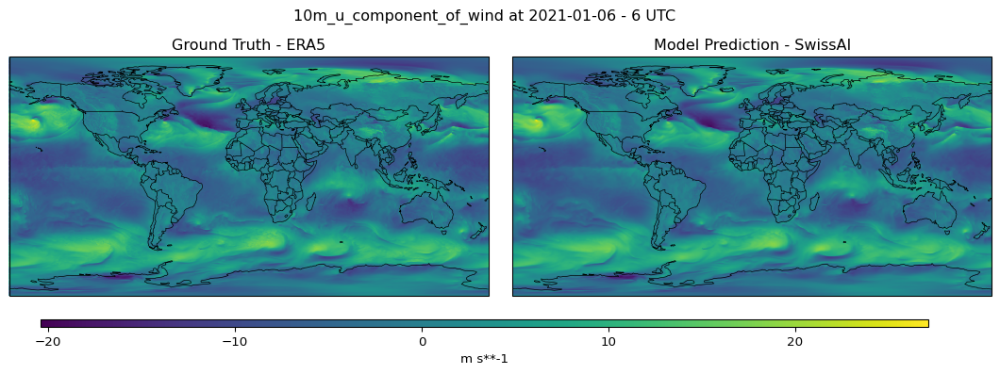

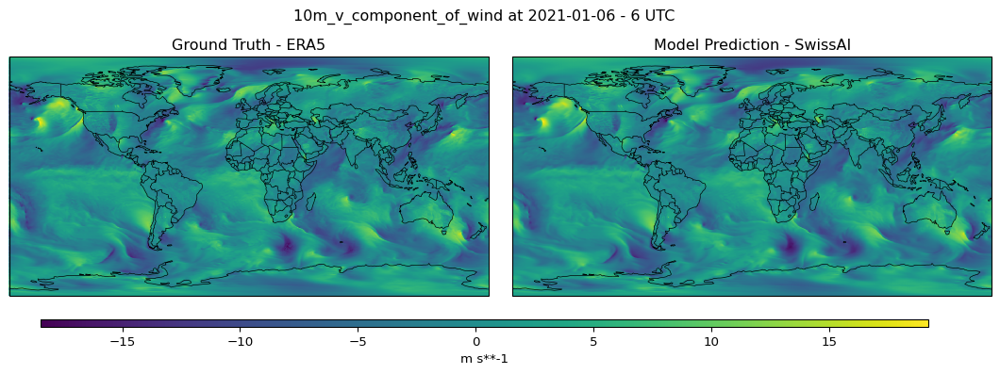

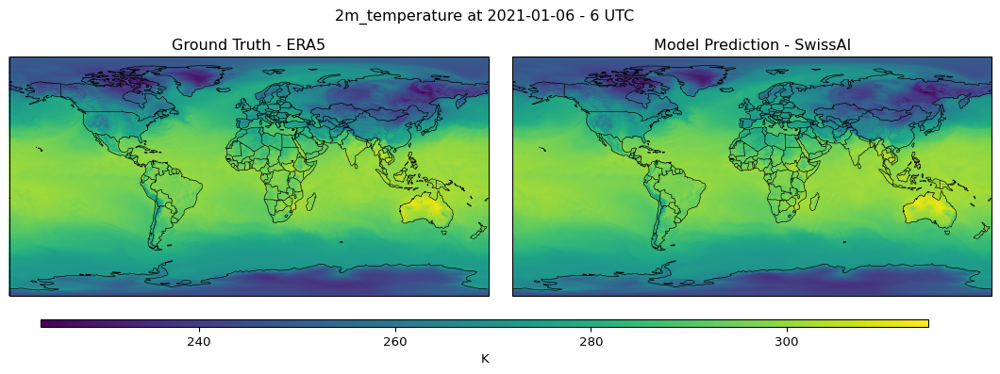

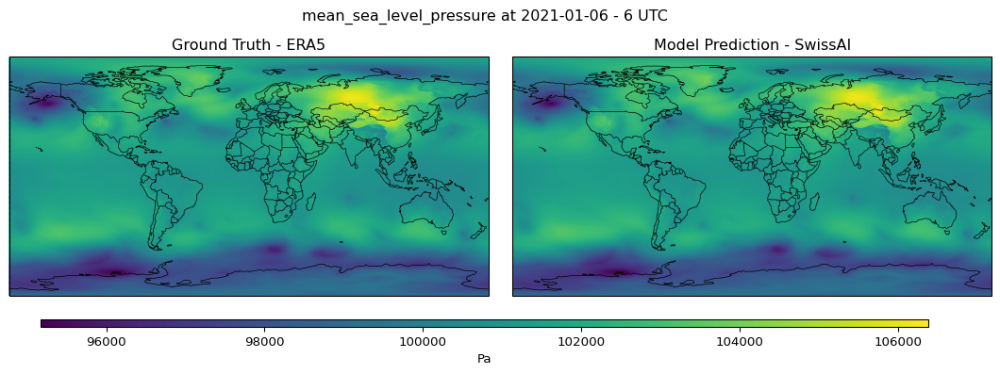

In [49]:
# For some tasks a random time step sample is selected
random.seed(RANDOM_SEED)
time_index = random.randint(0, len(ds.time) - 1)
time_selected = ds.time[time_index]
print(f"Selected time: {time_selected.values}")

for var in VARIABLES_2D:
    fig, axes = plt.subplots(
        1,
        2,
        figsize=(14, 4),
        dpi=DPI * 2,
        subplot_kw={"projection": ccrs.PlateCarree()},
    )

    ds_var = ds[var].isel(time=time_index)
    ds_ml_var = ds_ml[var].isel(time=time_index)

    vmin = min(ds_var.min().values, ds_ml_var.min().values)
    vmax = max(ds_var.max().values, ds_ml_var.max().values)

    im0 = ds_var.plot(
        ax=axes[0],
        cmap="viridis",
        vmin=vmin,
        vmax=vmax,
        add_colorbar=False,
        transform=ccrs.PlateCarree(),
    )
    axes[0].add_feature(cfeature.BORDERS, linewidth=0.5)
    axes[0].coastlines(linewidth=0.5)
    axes[0].set_title("Ground Truth - ERA5")

    im1 = ds_ml_var.plot(
        ax=axes[1],
        cmap="viridis",
        vmin=vmin,
        vmax=vmax,
        add_colorbar=False,
        transform=ccrs.PlateCarree(),
    )
    axes[1].add_feature(cfeature.BORDERS, linewidth=0.5)
    axes[1].coastlines(linewidth=0.5)
    axes[1].set_title("Model Prediction - SwissAI")

    # Add one colorbar for both subplots at the bottom
    cbar_ax = fig.add_axes([
        0.15,
        0.1,
        0.7,
        0.02,
    ])  # [left, bottom, width, height]
    cbar = fig.colorbar(im0, cax=cbar_ax, orientation="horizontal")

    # Add units to the colorbar
    units = ds[var].attrs.get("units", "")
    cbar.set_label(units)

    # Adjust subplot spacing
    plt.subplots_adjust(bottom=0.15, hspace=0.05, wspace=0.05)
    plt.suptitle(
        f"{var} at {str(time_selected.dt.date.values)} - {time_selected.dt.hour.values} UTC"
    )
    plt.show()

### 3D Variables
For variables that also have a vertical dimension the plots are displayed as 
a mosaic plot, with each subplot representing a different height level. The
colorbar has shared global limits across all vertical levels.

In [ ]:
for var in VARIABLES_3D:
    num_levels = len(LEVELS)
    num_rows = num_levels  # Updated to have one row per level
    fig, axes = plt.subplots(
        num_rows,
        2,
        figsize=(14, 4 * num_rows),
        dpi=DPI * 2,
        subplot_kw={"projection": ccrs.PlateCarree()},
    )
    # Compute vmin and vmax for all levels
    ds_var = ds[var].isel(time=time_index)
    ds_ml_var = ds_ml[var].isel(time=time_index)
    vmin = min(ds_var.min().values, ds_ml_var.min().values)
    vmax = max(ds_var.max().values, ds_ml_var.max().values)

    for idx, level in enumerate(LEVELS):
        # Left column: ds
        ax_ds = axes[idx, 0]
        ds_var_lev = ds_var.sel(level=level)
        ds_ml_var_lev = ds_ml_var.sel(level=level)

        im_ds = ds_var_lev.plot(
            ax=ax_ds,
            cmap="viridis",
            vmin=vmin,
            vmax=vmax,
            add_colorbar=False,
            transform=ccrs.PlateCarree(),
        )
        ax_ds.add_feature(cfeature.BORDERS, linewidth=0.5)
        ax_ds.coastlines(linewidth=0.5)
        ax_ds.set_title(f"Ground Truth - Level {level}")

        # Right column: ds_ml
        ax_ds_ml = axes[idx, 1]
        im_ds_ml = ds_ml_var_lev.plot(
            ax=ax_ds_ml,
            cmap="viridis",
            vmin=vmin,
            vmax=vmax,
            add_colorbar=False,
            transform=ccrs.PlateCarree(),
        )
        ax_ds_ml.add_feature(cfeature.BORDERS, linewidth=0.5)
        ax_ds_ml.coastlines(linewidth=0.5)
        ax_ds_ml.set_title(f"SwissAI - Level {level}")
        ax_ds_ml.add_feature(cfeature.BORDERS, linewidth=0.5)
        ax_ds_ml.coastlines(linewidth=0.5)
        ax_ds_ml.set_title(f"SwissAI - Level {level}")

    # Add one colorbar for all subplots at the bottom
    cbar_ax = fig.add_axes([0.15, 0.05, 0.7, 0.02])
    cbar = fig.colorbar(im_ds, cax=cbar_ax, orientation="horizontal")

    # Add units to the colorbar
    units = ds[var].attrs.get("units", "")
    cbar.set_label(units)

    plt.suptitle(
        f"{var} at {str(time_selected.dt.date.values)} - {time_selected.dt.hour.values} UTC"
    )
    plt.subplots_adjust(bottom=0.1, top=0.95, hspace=0.05, wspace=0.05)
    plt.show()

### 2. Histograms

### 2D Variables

This chapter compares the statistical distributions of atmospheric variables across different latitude bands using histograms. By examining these distributions, we can assess whether the ML model accurately captures the variability and frequency of different atmospheric states.

**Latitude Banding:** Atmospheric properties often vary significantly with latitude due to factors like solar radiation angles and the Coriolis effect. Segmenting data into 10-degree latitude bands allows for more meaningful comparisons.

**Distribution Shape:** The histograms show whether the ML model replicates the skewness, kurtosis, and overall shape of the ERA5 data distributions.

**Extreme Values:** Identifying how the model handles extreme conditions, such as unusually high or low temperatures, is crucial for weather prediction and risk assessment.

**Regional Performance:** Variations between latitude bands can indicate if the model performs differently in the tropics versus the poles.

**Normalization Needs:** Differences in scale between variables suggest that normalization may be necessary for accurate comparisons.

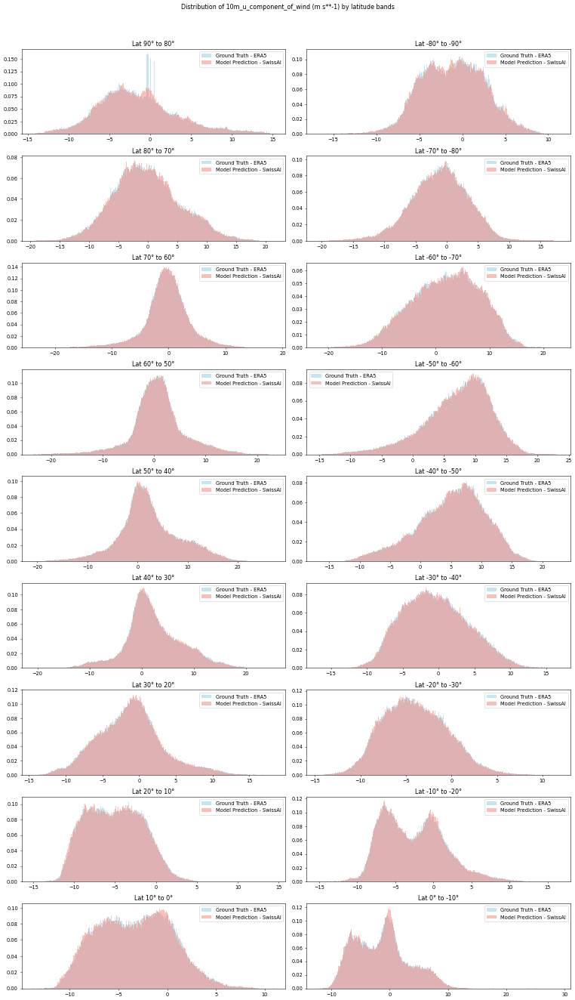

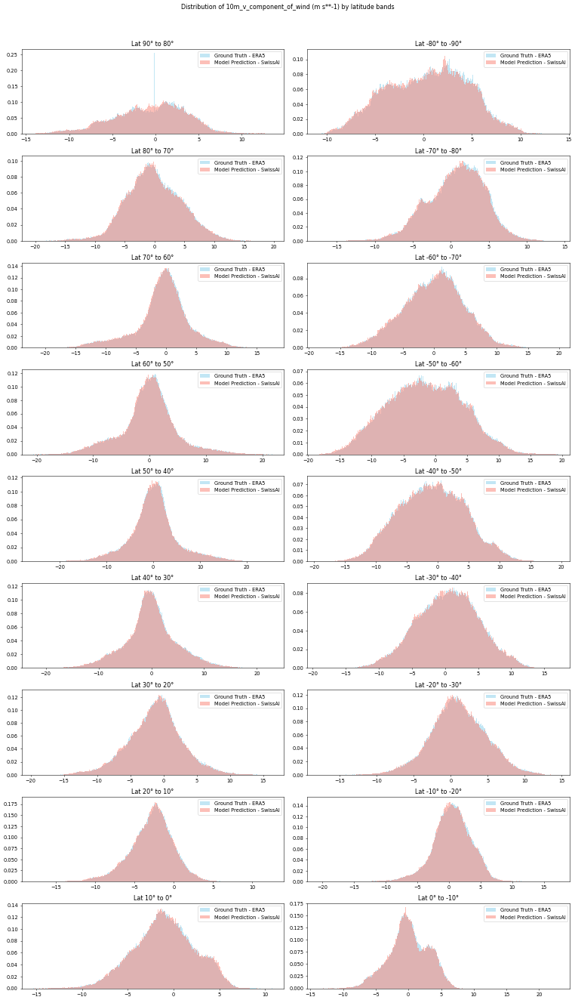

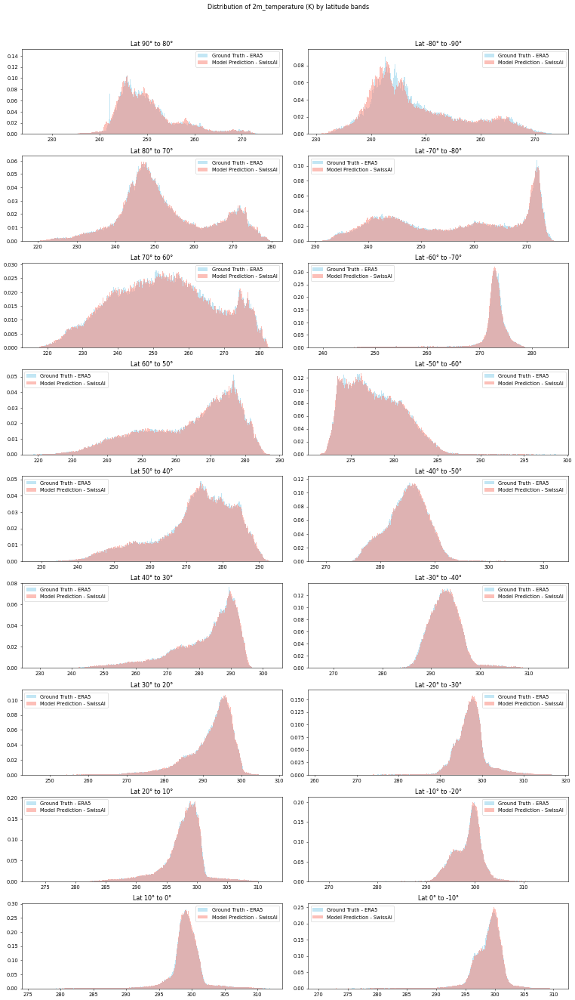

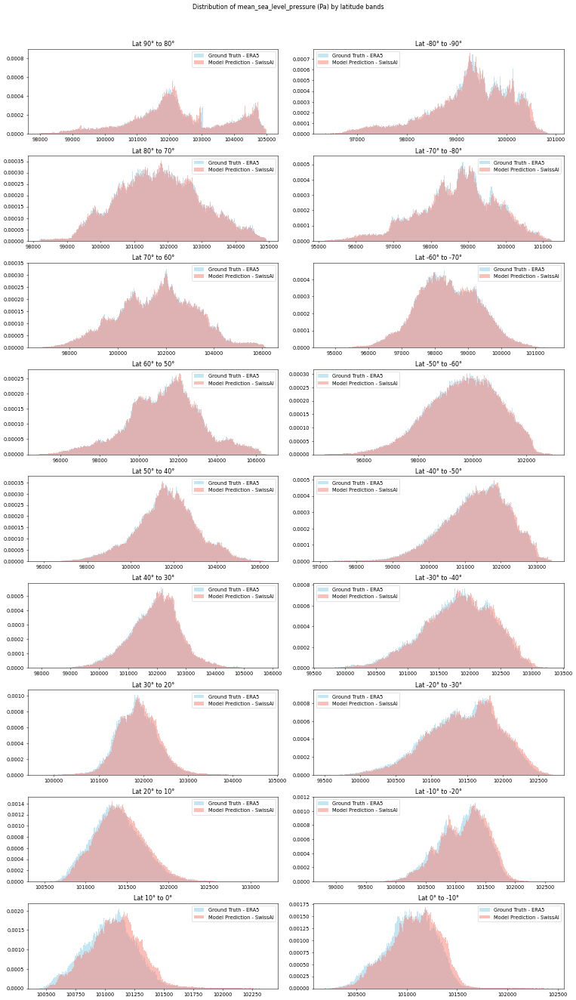

In [51]:
for variable_name in VARIABLES_2D:
    fig, axs = plt.subplots(n_rows, 2, figsize=(16, 3 * n_rows), dpi=DPI)
    # Process negative latitudes (right column)
    for i in range(n_bands // 2):
        lat_max = lat_bins[i]
        lat_min = lat_bins[i + 1]

        data_ds = (
            ds[variable_name]
            .sel(latitude=slice(lat_min, lat_max))
            .values.flatten()
        )
        data_ds_ml = (
            ds_ml[variable_name]
            .sel(latitude=slice(lat_min, lat_max))
            .values.flatten()
        )

        axs[i, 1].hist(
            data_ds,
            bins=1000,
            density=True,
            alpha=0.5,
            color="skyblue",
            label="Ground Truth - ERA5",
        )
        axs[i, 1].hist(
            data_ds_ml,
            bins=1000,
            density=True,
            alpha=0.5,
            color="salmon",
            label="Model Prediction - SwissAI",
        )
        axs[i, 1].set_title(f"Lat {lat_min}° to {lat_max}°")
        axs[i, 1].legend()

    # Process positive latitudes (left column)
    for i in range(n_bands // 2):
        idx = -(i + 1)  # Start from the end
        lat_max = lat_bins[idx - 1]
        lat_min = lat_bins[idx]

        data_ds = (
            ds[variable_name]
            .sel(latitude=slice(lat_min, lat_max))
            .values.flatten()
        )
        data_ds_ml = (
            ds_ml[variable_name]
            .sel(latitude=slice(lat_min, lat_max))
            .values.flatten()
        )

        axs[i, 0].hist(
            data_ds,
            bins=1000,
            density=True,
            alpha=0.5,
            color="skyblue",
            label="Ground Truth - ERA5",
        )
        axs[i, 0].hist(
            data_ds_ml,
            bins=1000,
            density=True,
            alpha=0.5,
            color="salmon",
            label="Model Prediction - SwissAI",
        )
        axs[i, 0].set_title(f"Lat {lat_min}° to {lat_max}°")
        axs[i, 0].legend()

    units = ds[variable_name].attrs.get("units", "")
    plt.suptitle(
        f"Distribution of {variable_name} ({units}) by latitude bands", y=1.02
    )

    plt.tight_layout()
    plt.show()

### 3D Variables
Plotting of histograms for 3d_variables is disabled by default as it creates a
lot of plots for the individual vertical levels. The number of bins is reduced
from 1000 to 100. This can be adjusted in the code below.

In [ ]:
%%script echo skipping
for variable_name in VARIABLES_3D:
    for level in LEVELS:
        fig, axs = plt.subplots(n_rows, 2, figsize=(16, 3 * n_rows), dpi=DPI)
        # Process negative latitudes (right column)
        for i in range(n_bands // 2):
            lat_max = lat_bins[i]
            lat_min = lat_bins[i + 1]

            data_ds = (
                ds[variable_name]
                .sel(level=level, latitude=slice(lat_min, lat_max))
                .values.flatten()
            )
            data_ds_ml = (
                ds_ml[variable_name]
                .sel(level=level, latitude=slice(lat_min, lat_max))
                .values.flatten()
            )

            axs[i, 1].hist(
                data_ds,
                bins=100,
                density=True,
                alpha=0.5,
                color="skyblue",
                label="Ground Truth - ERA5",
            )
            axs[i, 1].hist(
                data_ds_ml,
                bins=100,
                density=True,
                alpha=0.5,
                color="salmon",
                label="Model Prediction - SwissAI",
            )
            axs[i, 1].set_title(f"Lat {lat_min}° to {lat_max}°")
            axs[i, 1].legend()

        # Process positive latitudes (left column)
        for i in range(n_bands // 2):
            idx = -(i + 1)
            lat_max = lat_bins[idx - 1]
            lat_min = lat_bins[idx]

            data_ds = (
                ds[variable_name]
                .sel(level=level, latitude=slice(lat_min, lat_max))
                .values.flatten()
            )
            data_ds_ml = (
                ds_ml[variable_name]
                .sel(level=level, latitude=slice(lat_min, lat_max))
                .values.flatten()
            )

            axs[i, 0].hist(
                data_ds,
                bins=100,
                density=True,
                alpha=0.5,
                color="skyblue",
                label="Ground Truth - ERA5",
            )
            axs[i, 0].hist(
                data_ds_ml,
                bins=100,
                density=True,
                alpha=0.5,
                color="salmon",
                label="Model Prediction - SwissAI",
            )
            axs[i, 0].set_title(f"Lat {lat_min}° to {lat_max}°")
            axs[i, 0].legend()

        plt.suptitle(
            f"Distribution of {variable_name} at level {level} by latitude bands",
            y=1.02,
        )
        plt.tight_layout()
        plt.show()

skipping


### 3. Wasserstein Distance + KDE

In this chapter, we delve deeper into the statistical comparison by employing the Wasserstein distance and Kernel Density Estimation (KDE). This provides a quantitative measure of how similar the distributions are between the ML model and the ERA5 data.

**Normalization**: Normalizing the data ensures that comparisons are not skewed by differing units or scales, allowing for a fair assessment across variables. The process of normalization might mask or exaggerate certain features. It's important to consider both normalized and raw data when drawing conclusions.

**Wasserstein Distance:** This metric quantifies the difference between two probability distributions, offering a single value that summarizes the discrepancy.

**KDE Plots:** KDEs provide a smooth estimate of the data distribution, making it easier to compare the overall shape and detect subtle differences.

**Interpretation of Wasserstein Distance:** A higher Wasserstein distance indicates greater divergence, but the acceptable threshold may vary depending on the context and variable.

### 2D Variables

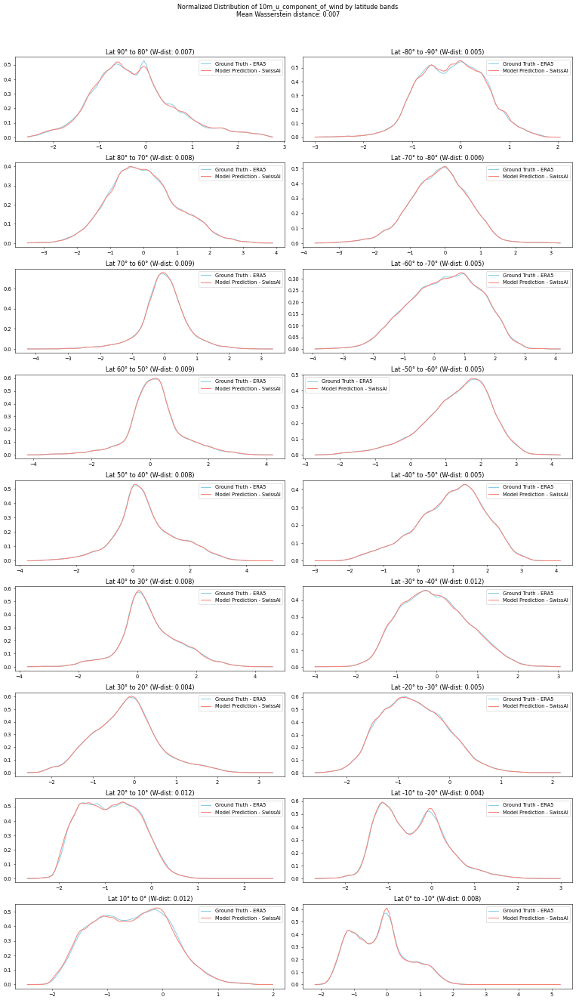

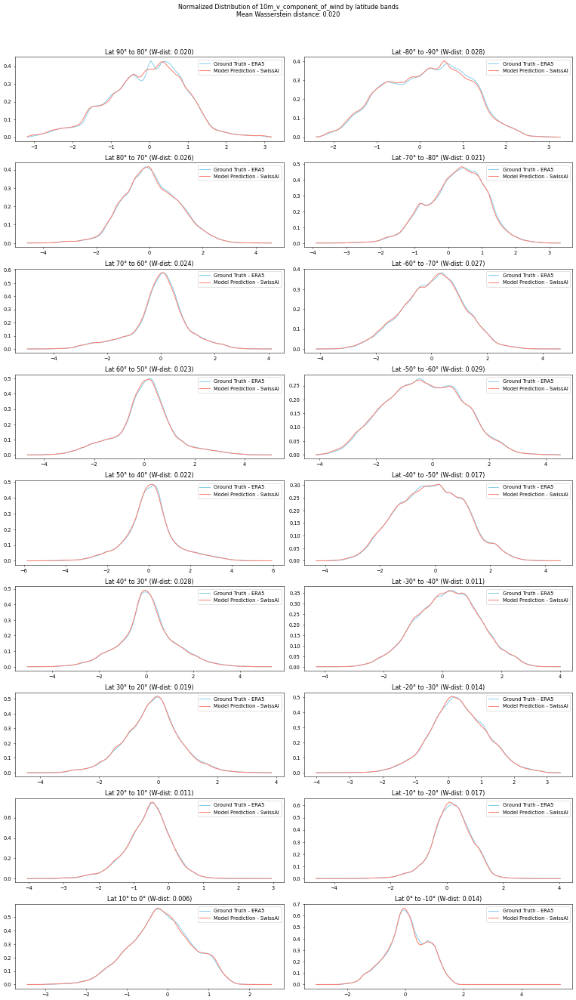

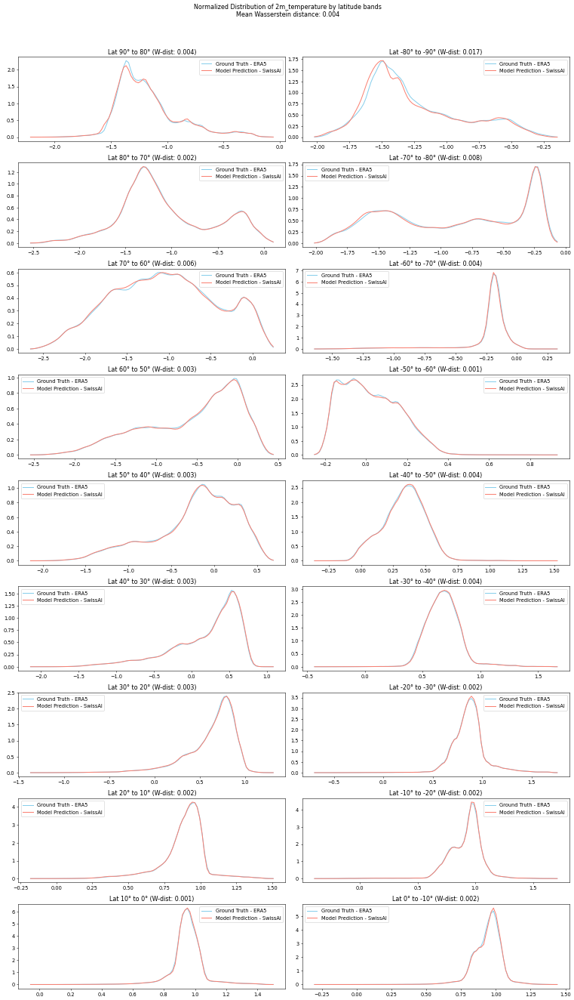

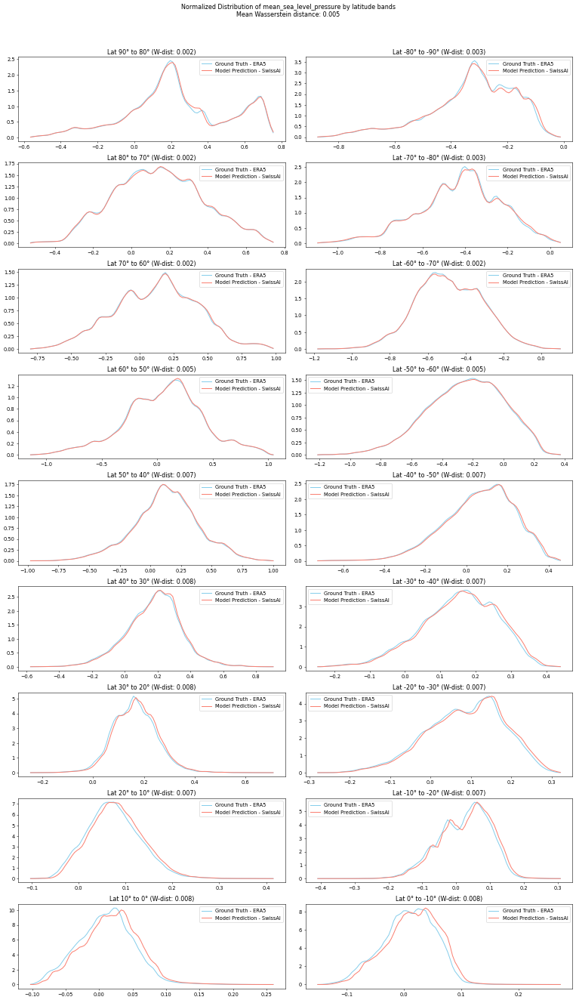

In [52]:
for variable_name in VARIABLES_2D:
    fig, axs = plt.subplots(n_rows, 2, figsize=(16, 3 * n_rows), dpi=DPI)
    w_distances = []  # Store Wasserstein distances for each band

    # Process negative latitudes (right column)
    for i in range(n_bands // 2):
        lat_max = lat_bins[i]
        lat_min = lat_bins[i + 1]

        # Get data for this latitude band
        ds_slice = ds_standardized[variable_name].sel(
            latitude=slice(lat_min, lat_max)
        )
        ds_ml_slice = ds_ml_standardized[variable_name].sel(
            latitude=slice(lat_min, lat_max)
        )

        if ds_slice.size == 0 or ds_ml_slice.size == 0:
            axs[i, 1].set_title(f"Lat {lat_min}° to {lat_max}° (No data)")
            continue

        ds_flattened = ds_slice.values.flatten()
        ds_ml_flattened = ds_ml_slice.values.flatten()

        # Calculate Wasserstein distance on normalized data
        w_dist = wasserstein_distance(ds_flattened, ds_ml_flattened)
        w_distances.append((lat_min, lat_max, w_dist))

        # Fit and plot KDEs
        kde_ds = gaussian_kde(ds_flattened)
        kde_ds_ml = gaussian_kde(ds_ml_flattened)

        x_eval = np.linspace(
            min(ds_flattened.min(), ds_ml_flattened.min()),
            max(ds_flattened.max(), ds_ml_flattened.max()),
            100,
        )

        axs[i, 1].plot(
            x_eval,
            kde_ds(x_eval),
            color="skyblue",
            label="Ground Truth - ERA5",
        )
        axs[i, 1].plot(
            x_eval,
            kde_ds_ml(x_eval),
            color="salmon",
            label="Model Prediction - SwissAI",
        )
        axs[i, 1].set_title(
            f"Lat {lat_min}° to {lat_max}° (W-dist: {w_dist:.3f})"
        )
        axs[i, 1].legend()

    # Process positive latitudes (left column)
    for i in range(n_bands // 2):
        idx = -(i + 1)
        lat_max = lat_bins[idx - 1]
        lat_min = lat_bins[idx]

        # Get data for this latitude band
        ds_slice = ds_standardized[variable_name].sel(
            latitude=slice(lat_min, lat_max)
        )
        ds_ml_slice = ds_ml_standardized[variable_name].sel(
            latitude=slice(lat_min, lat_max)
        )

        if ds_slice.size == 0 or ds_ml_slice.size == 0:
            axs[i, 0].set_title(f"Lat {lat_min}° to {lat_max}° (No data)")
            continue

        ds_flattened = ds_slice.values.flatten()
        ds_ml_flattened = ds_ml_slice.values.flatten()

        # Calculate Wasserstein distance on normalized data
        w_dist = wasserstein_distance(ds_flattened, ds_ml_flattened)
        w_distances.append((lat_min, lat_max, w_dist))

        # Fit and plot KDEs
        kde_ds = gaussian_kde(ds_flattened)
        kde_ds_ml = gaussian_kde(ds_ml_flattened)

        x_eval = np.linspace(
            min(ds_flattened.min(), ds_ml_flattened.min()),
            max(ds_flattened.max(), ds_ml_flattened.max()),
            100,
        )

        axs[i, 0].plot(
            x_eval,
            kde_ds(x_eval),
            color="skyblue",
            label="Ground Truth - ERA5",
        )
        axs[i, 0].plot(
            x_eval,
            kde_ds_ml(x_eval),
            color="salmon",
            label="Model Prediction - SwissAI",
        )
        axs[i, 0].set_title(
            f"Lat {lat_min}° to {lat_max}° (W-dist: {w_dist:.3f})"
        )
        axs[i, 0].legend()

    mean_w_dist = (
        np.mean([w[2] for w in w_distances]) if w_distances else float("nan")
    )
    plt.suptitle(
        f"Normalized Distribution of {variable_name} by latitude bands\n"
        f"Mean Wasserstein distance: {mean_w_dist:.3f}",
        y=1.02,
    )
    plt.tight_layout()
    plt.show()

### 3D Variables
For 3d_variables, the Wasserstein distance is calculated for each vertical level
separately. This is disabled by default!


In [ ]:
%%script echo skipping
for variable_name in VARIABLES_3D:
    for level in LEVELS:
        fig, axs = plt.subplots(n_rows, 2, figsize=(16, 3 * n_rows), dpi=DPI)
        w_distances = []  # Store Wasserstein distances for each band

        # Process negative latitudes (right column)
        for i in range(n_bands // 2):
            lat_max = lat_bins[i]
            lat_min = lat_bins[i + 1]

            ds_flattened = (
                ds_standardized[variable_name]
                .sel(latitude=slice(lat_min, lat_max))
                .values.flatten()
            )
            ds_ml_flattened = (
                ds_ml_standardized[variable_name]
                .sel(latitude=slice(lat_min, lat_max))
                .values.flatten()
            )

            # Calculate Wasserstein distance on normalized data
            w_dist = wasserstein_distance(ds_flattened, ds_ml_flattened)
            w_distances.append((lat_min, lat_max, w_dist))

            # Fit KDEs
            kde_ds = gaussian_kde(ds_flattened)
            kde_ds_ml = gaussian_kde(ds_ml_flattened)

            # Evaluate KDEs
            x_eval = np.linspace(
                min(ds_flattened.min(), ds_ml_flattened.min()),
                max(ds_flattened.max(), ds_ml_flattened.max()),
                100,
            )

            axs[i, 1].plot(
                x_eval,
                kde_ds(x_eval),
                color="skyblue",
                label="Ground Truth - ERA5",
            )
            axs[i, 1].plot(
                x_eval,
                kde_ds_ml(x_eval),
                color="salmon",
                label="Model Prediction - SwissAI",
            )
            axs[i, 1].set_title(
                f"Lat {lat_min}° to {lat_max}° (W-dist: {w_dist:.3f})"
            )
            axs[i, 1].legend()

        # Process positive latitudes (left column)
        for i in range(n_bands // 2):
            idx = -(i + 1)
            lat_max = lat_bins[idx - 1]
            lat_min = lat_bins[idx]

            ds_flattened = (
                ds_standardized[variable_name]
                .sel(latitude=slice(lat_min, lat_max))
                .values.flatten()
            )
            ds_ml_flattened = (
                ds_ml_standardized[variable_name]
                .sel(latitude=slice(lat_min, lat_max))
                .values.flatten()
            )

            # Calculate Wasserstein distance on normalized data
            w_dist = wasserstein_distance(ds_flattened, ds_ml_flattened)
            w_distances.append((lat_min, lat_max, w_dist))

            # Fit KDEs
            kde_ds = gaussian_kde(ds_flattened)
            kde_ds_ml = gaussian_kde(ds_ml_flattened)

            # Evaluate KDEs
            x_eval = np.linspace(
                min(ds_flattened.min(), ds_ml_flattened.min()),
                max(ds_flattened.max(), ds_ml_flattened.max()),
                100,
            )

            axs[i, 0].plot(
                x_eval,
                kde_ds(x_eval),
                color="skyblue",
                label="Ground Truth - ERA5",
            )
            axs[i, 0].plot(
                x_eval,
                kde_ds_ml(x_eval),
                color="salmon",
                label="Model Prediction - SwissAI",
            )
            axs[i, 0].set_title(
                f"Lat {lat_min}° to {lat_max}° (W-dist: {w_dist:.3f})"
            )
            axs[i, 0].legend()

        plt.suptitle(
            f"Normalized Distribution of {variable_name} at level {level} by latitude bands\n"
            + f"Mean Wasserstein distance: {np.mean([w[2] for w in w_distances]):.3f}",
            y=1.02,
        )
        plt.tight_layout()
        plt.show()

skipping


### 4. Energy Spectra

This chapter examines how energy is distributed across different spatial scales
in the atmosphere by computing and comparing the energy spectra of both models.
This analysis is critical in understanding the models' capabilities to simulate
atmospheric processes ranging from large-scale weather systems to small-scale
turbulence.

**FFT Computation:** The Fast Fourier Transform (FFT) is used to transform spatial data into the frequency domain, revealing how different scales contribute to the overall energy.

**Consideration of Earth's Curvature:** Adjustments are made for latitude to accurately calculate physical distances, which is essential for a meaningful spectrum analysis.

**Scale Representation:** The energy spectra show whether the ML model captures the correct amount of energy at various spatial scales.

**Effective Resolution:** Identifying the effective resolution helps understand the smallest scales that the model can reliably simulate.

**Numerical Artifacts:** Limitations in numerical precision can introduce artifacts in the spectra, especially at the smallest scales.

**Reference Slopes:** Including k^(-3) and k^(-5/3) slopes provides
benchmarks based on theoretical expectations from atmospheric dynamics.
TODO: Are these slopes relevant for all variables or just turbulent kinetic
energy? 

In [10]:
def calculate_energy_spectra(data):
    """Calculate the energy spectra of the given data.

    Parameters
    ----------
    data :
        The data for which the energy spectra should be calculated.

    Returns
    -------
    wavenumber : np.ndarray
        The wavenumbers in number of cycles that fit around the globe.
        These are calculated for each latitude and averaged.

    power: np.ndarray
        The power at the respective wavenumber.
        These are calculated for each latitude and averaged.
    """

    EARTH_RADIUS_KM = 6371.0
    wavenumber_list = []

    var_data = data.transpose("latitude", "longitude", "time")
    var_data = var_data.interpolate_na(dim="longitude")
    n_lon = var_data.longitude.size

    # Convert latitude to radians and calculate spacing
    latitudes = np.deg2rad(var_data.latitude.values)  # (n_lat,)
    cos_latitudes = np.cos(latitudes)  # (n_lat,)
    # Calculate the circumference at this latitude (in km)
    circumference = 2 * np.pi * EARTH_RADIUS_KM * cos_latitudes  # (n_lat,)
    # Calculate the physical distance between longitude points (in km)
    dx = circumference / n_lon  # km between longitude points (n_lat,)
    # Perform FFT along the latitude dimension (axis=0)
    fft = np.fft.rfft(var_data, axis=1)  # (lat, n_lon_fft, time)

    # Calculate wavenumbers along latitude
    for dx_item in dx:
        wavenumber = (
            np.fft.rfftfreq(n_lon, d=dx_item) * n_lon * dx_item
        )  # (n_lon_fft,)
        wavenumber_list.append(wavenumber)  # (n_lat, n_lon_fft)
    average_wavenumber = np.average(
        np.array(wavenumber_list), axis=0
    )  # (n_lon_fft,)

    # Calculate power spectrum
    power_spectrum = np.abs(fft) ** 2  # Shape: (lat, n_lon_fft, time)

    # Average power spectrum over time and weigthed average over latitude
    power_spectrum_mean = np.average(
        power_spectrum.mean(axis=-1), axis=0, weights=cos_latitudes
    )  # (n_lon_fft,)
    # The effective model resolution shows the smallest wavenumber that can be
    # resolved by the model
    effective_resolution = 1 / (4 * dx.mean()) * (2 * np.pi * EARTH_RADIUS_KM)

    # Removing the first and last two wavenumbers to avoid numerical instabilities
    return (
        average_wavenumber[2:-2],
        power_spectrum_mean[2:-2],
        effective_resolution,
    )


def plot_energy_spectra(ds, ds_ml, var, level=None):
    """
    Plot energy spectra comparison with LSD metric

    Parameters:
    -----------
    ds : xarray.Dataset
        Ground truth dataset
    ds_ml : xarray.Dataset
        Model prediction dataset
    var : str
        Variable name to analyze
    level : int, optional
        Pressure level for 3D variables
    """
    if level is not None:
        var_data = ds[var].sel(level=level)
        var_data_ml = ds_ml[var].sel(level=level)
    else:
        var_data = ds[var]
        var_data_ml = ds_ml[var]

    # Calculate energy spectra
    wavenumber_ds, spectrum_ds, effective_resolution = calculate_energy_spectra(
        var_data
    )
    wavenumber_ds_ml, spectrum_ds_ml, _ = calculate_energy_spectra(var_data_ml)

    # Create plot
    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot spectra
    ax.loglog(
        wavenumber_ds,
        spectrum_ds,
        color="skyblue",
        label="Ground Truth - ERA5",
    )
    ax.loglog(
        wavenumber_ds_ml,
        spectrum_ds_ml,
        color="salmon",
        label="Model Prediction - SwissAI",
    )

    # Calculate the range for the k^(-3) and k^(-5/3) lines
    k_min = min(wavenumber_ds.min(), wavenumber_ds_ml.min())
    k_max = max(wavenumber_ds.max(), wavenumber_ds_ml.max())
    k_range = np.logspace(np.log10(k_min + 1e-6), np.log10(k_max), 10)

    # Calculate the maximum y-value for scaling the lines
    y_max = max(spectrum_ds.max(), spectrum_ds_ml.max())

    # Plot the k^(-3) line
    ax.loglog(
        k_range,
        y_max * k_range ** (-3),
        "--",
        alpha=0.5,
        label="k⁻³",
        color="white",
    )

    # Plot the k^(-5/3) line
    ax.loglog(
        k_range,
        y_max * k_range ** (-5 / 3),
        ":",
        alpha=0.5,
        label="k⁻⁵ᐟ³",
        color="white",
    )

    # Plot effective resolution
    ax.axvline(
        effective_resolution,
        color="goldenrod",
        linestyle="--",
        label="Effective Model Resolution",
    )

    # Add LSD metric
    add_lsd_to_plot(ax, spectrum_ds, spectrum_ds_ml)

    # Customize plot
    ax.set_xlabel("Wavenumber (num cycles around the Earth)")
    ax.set_ylabel("Energy Density")
    title = f"Energy Spectra Comparison for {var}"
    if level is not None:
        title += f" at Level {level}"
    ax.set_title(title)
    ax.legend()
    ax.grid(True, which="both", ls="--", alpha=0.5)

    plt.tight_layout()
    return fig, ax


def calculate_log_spectral_distance(spectrum1, spectrum2):
    """
    Calculate the Log Spectral Distance between two power spectra
    """
    eps = 1e-10
    log_spec1 = np.log10(spectrum1 + eps)
    log_spec2 = np.log10(spectrum2 + eps)
    lsd = np.sqrt(np.mean((log_spec1 - log_spec2) ** 2))
    return lsd


def add_lsd_to_plot(ax, true_spectrum, pred_spectrum):
    """
    Add LSD metric as text box to spectrum plot
    """
    lsd = calculate_log_spectral_distance(true_spectrum, pred_spectrum)
    textstr = f"LSD = {lsd:.4f}"
    props = dict(boxstyle="round", facecolor="wheat", alpha=0.5)
    ax.text(
        0.5,
        0.05,
        textstr,
        transform=ax.transAxes,
        verticalalignment="top",
        bbox=props,
    )

### 2D Variables

To interpret the Log-Spectral Distance (LSD) metric:

Lower values indicate better similarity between spectra
- LSD = 0 means identical spectra

Typical values depend on the specific application, but generally:
- LSD < 1: Good similarity
- 1 < LSD < 2: Moderate differences
- LSD > 2: Significant differences

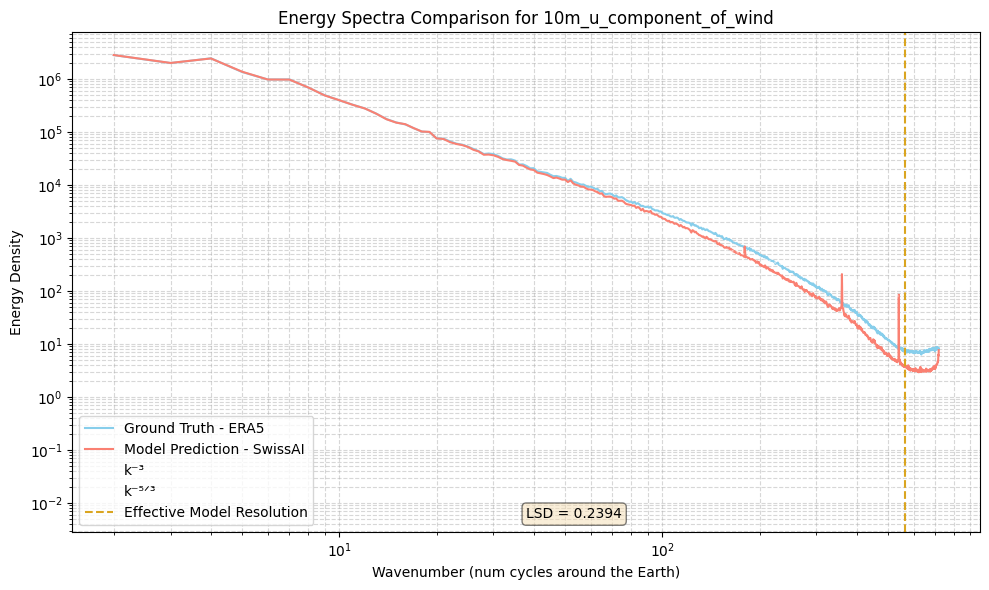

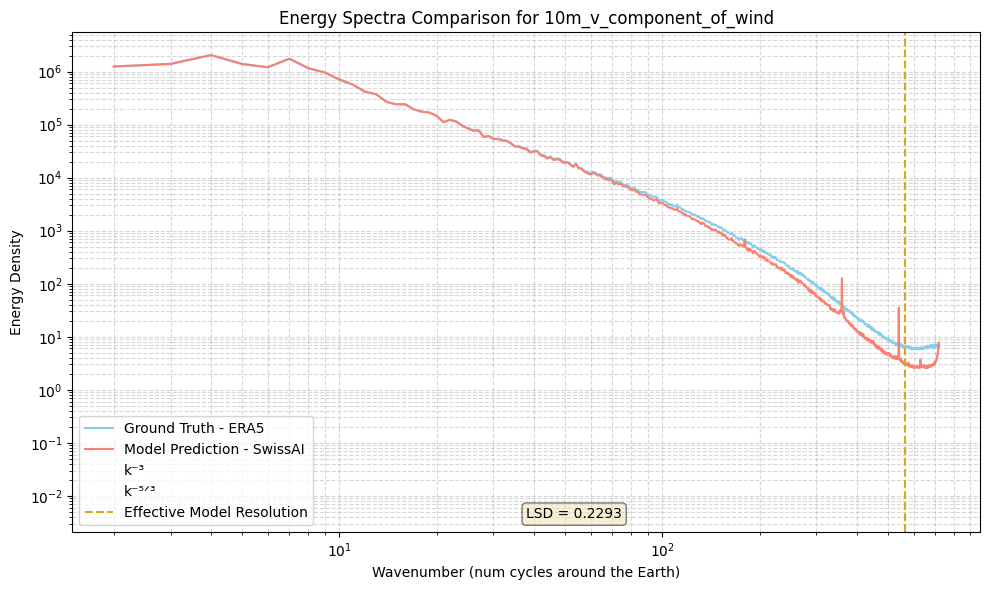

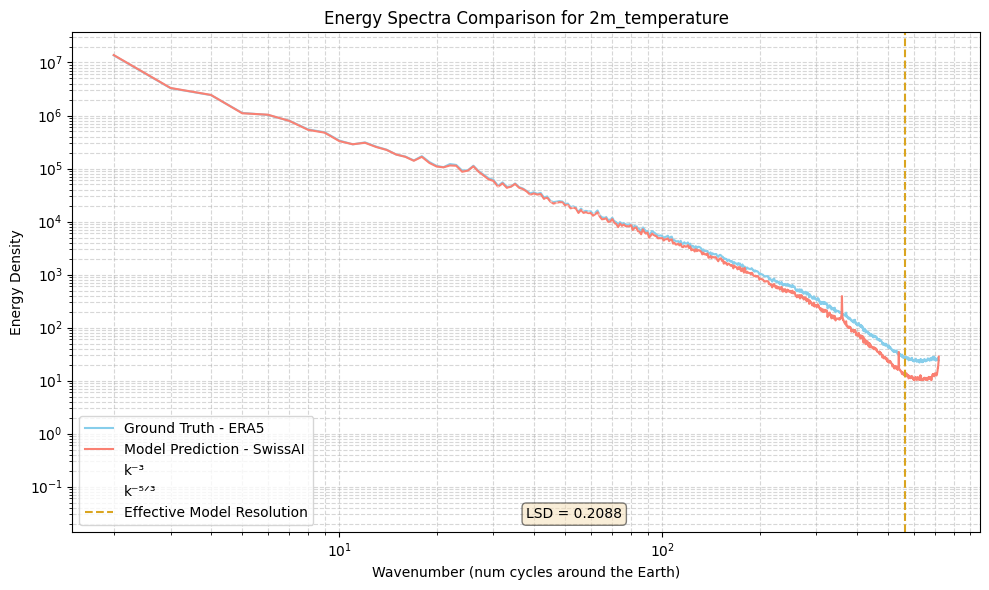

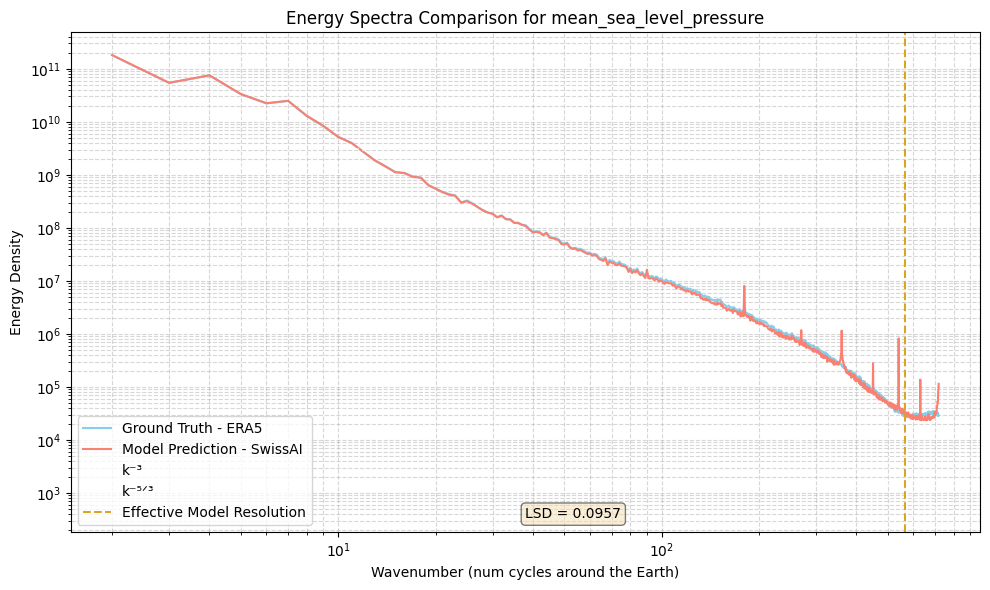

In [54]:
# For 2D variables
for var in VARIABLES_2D:
    fig, ax = plot_energy_spectra(ds, ds_ml, var)
    plt.show()

### 3D Variables

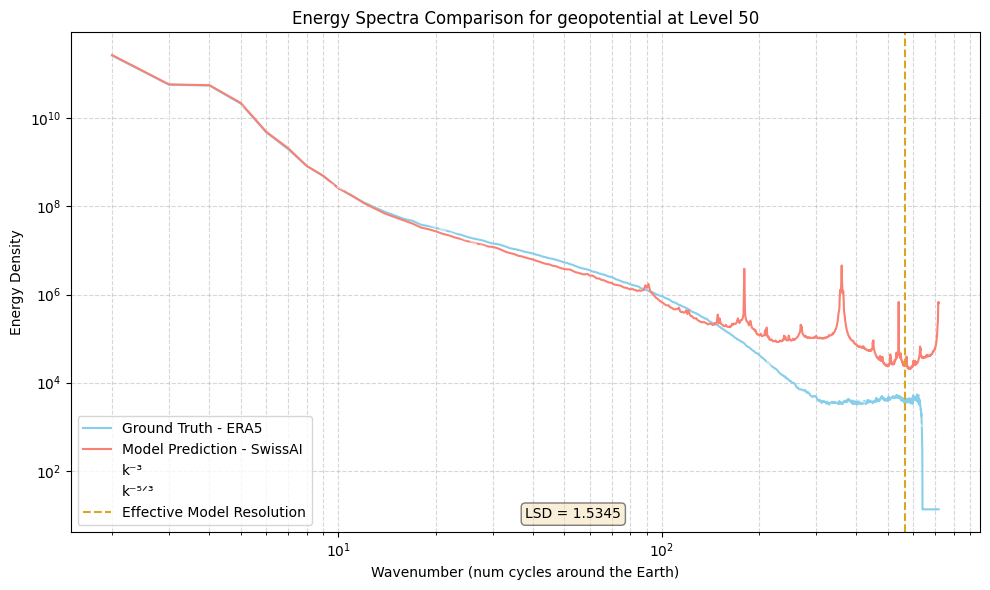

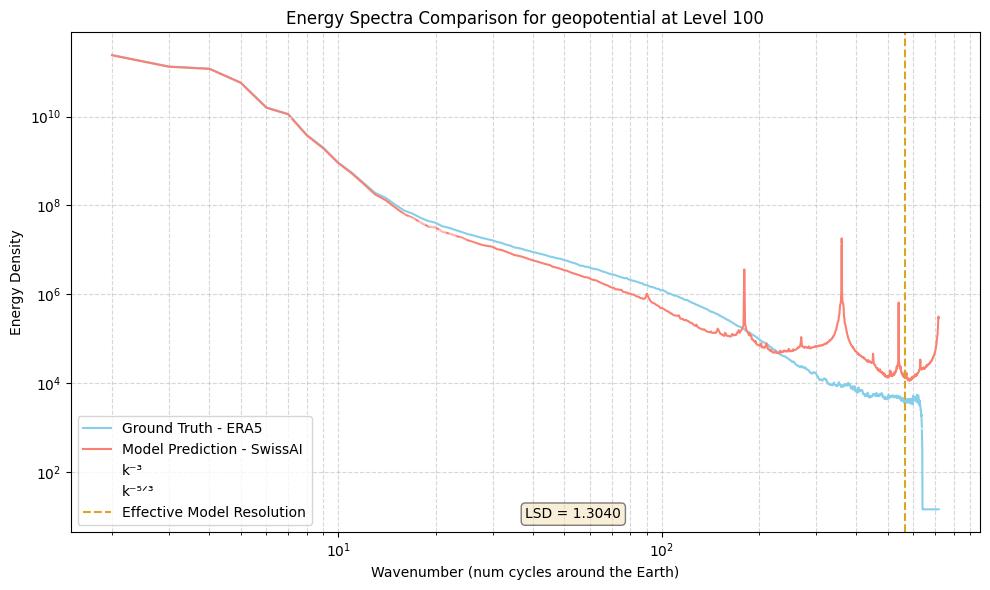

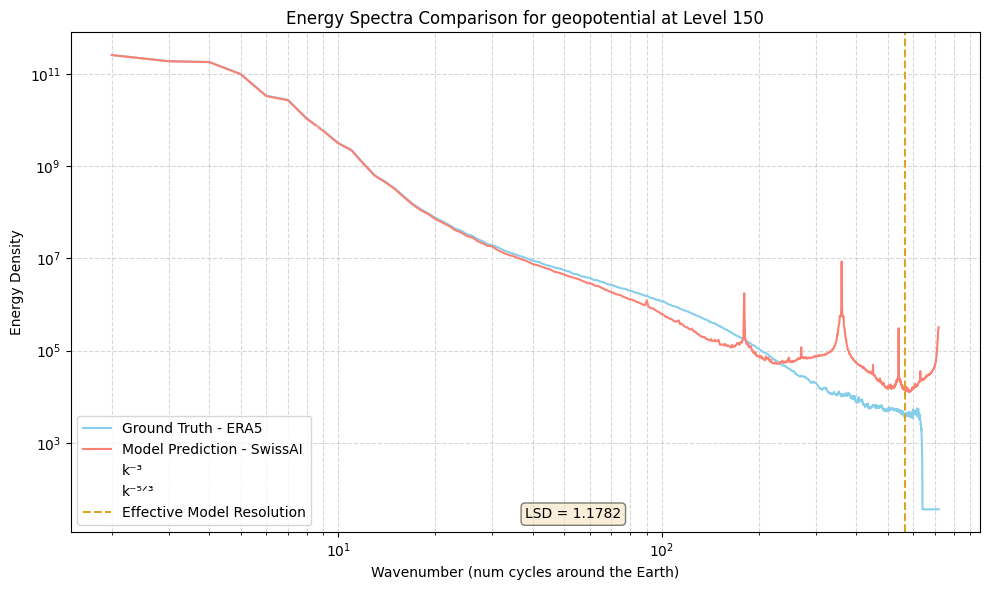

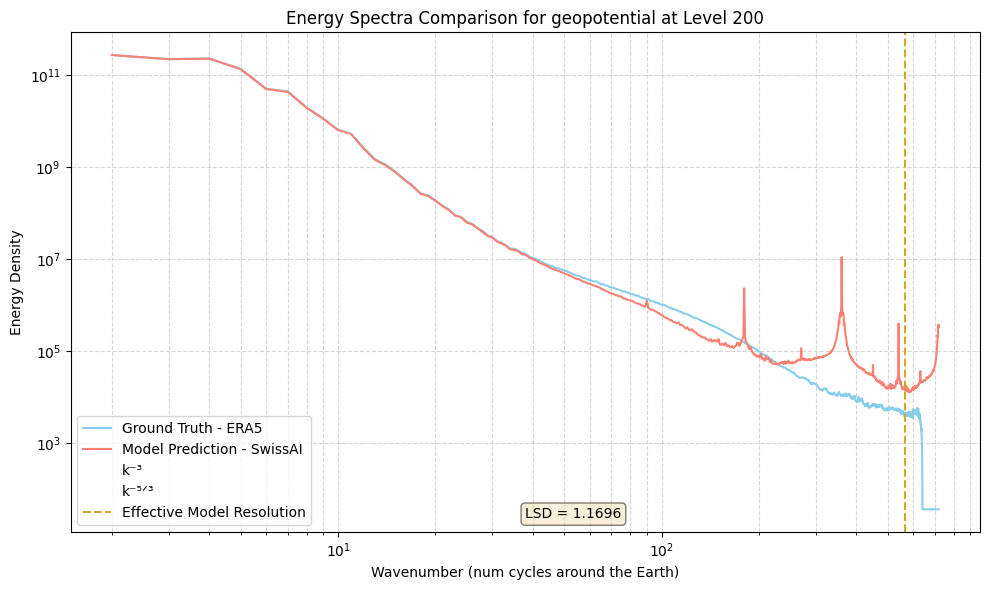

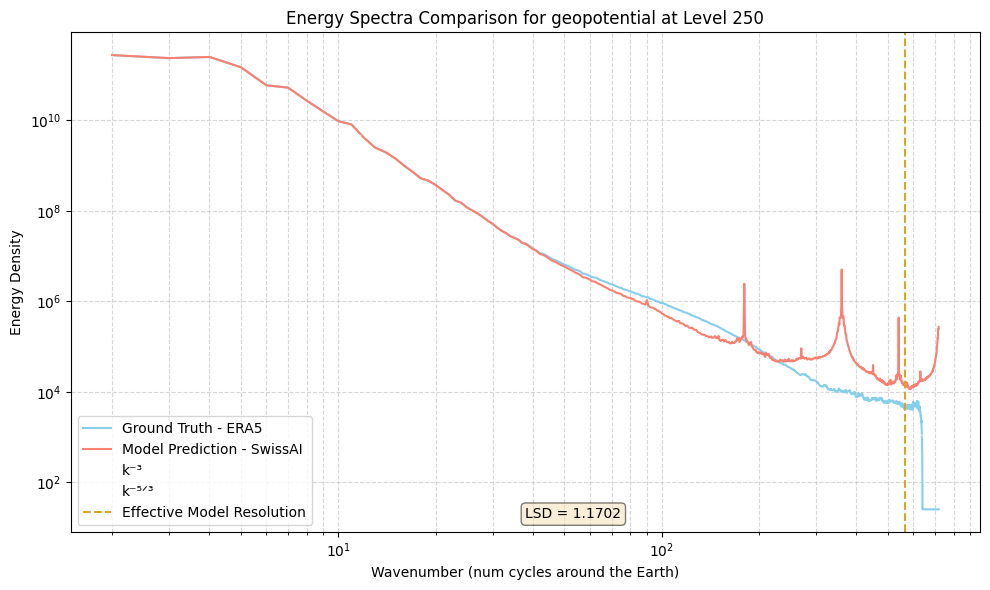

...

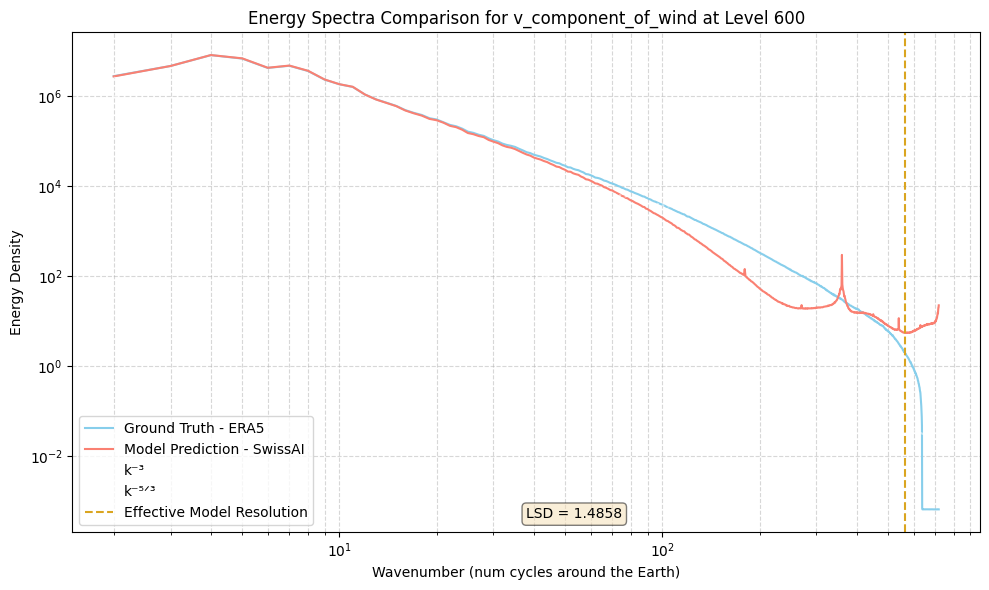

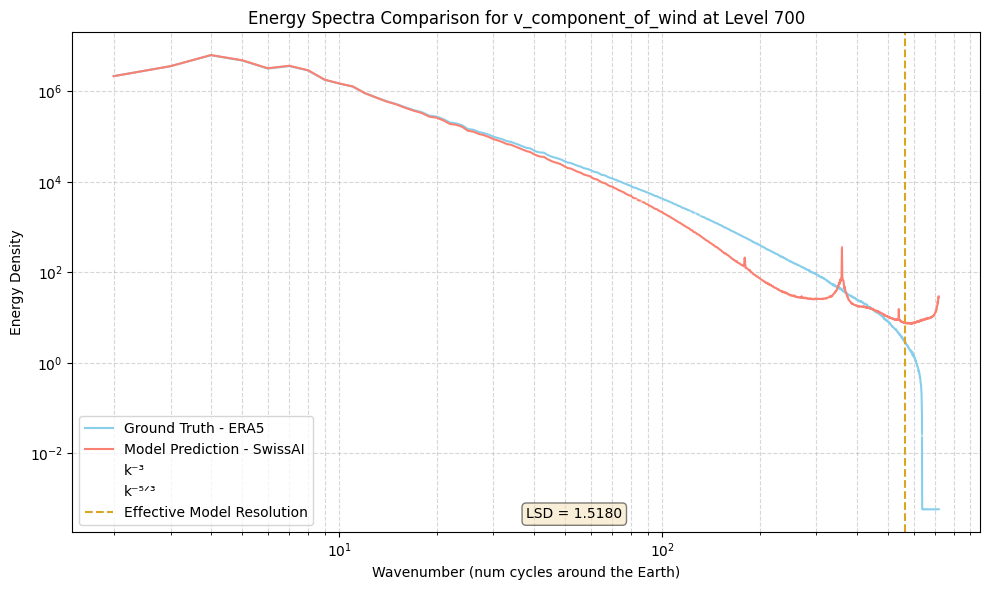

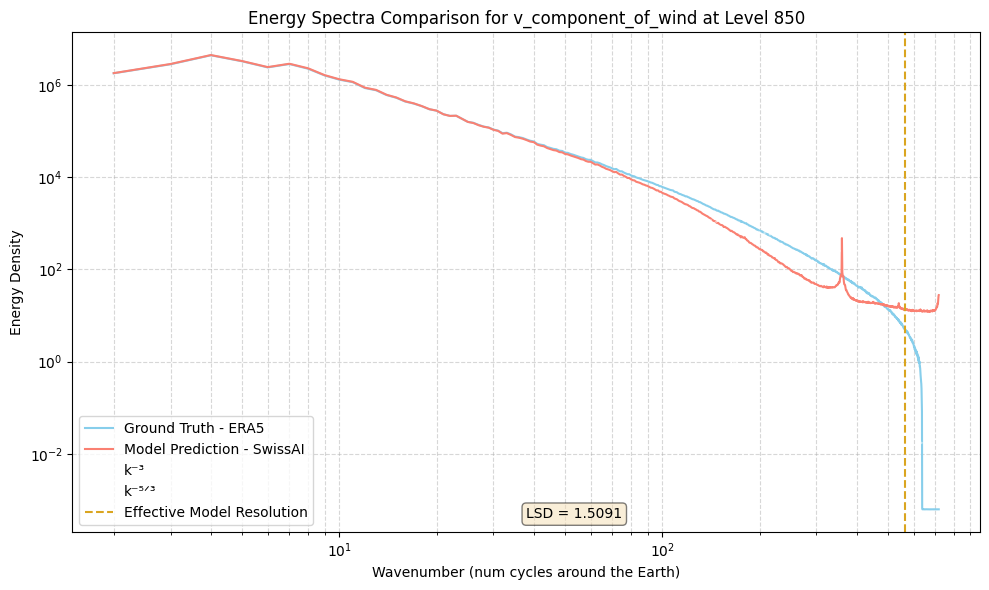

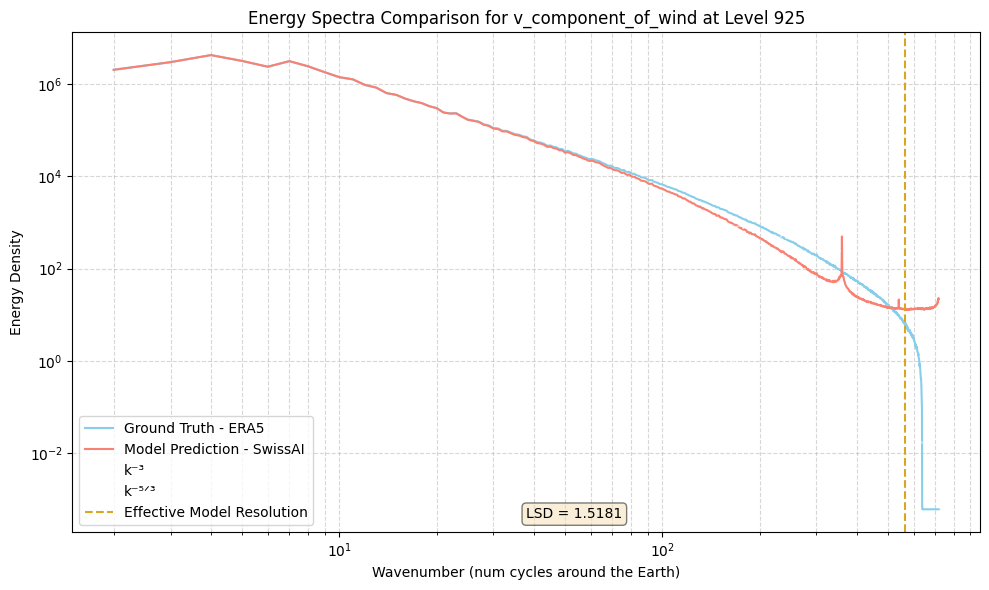

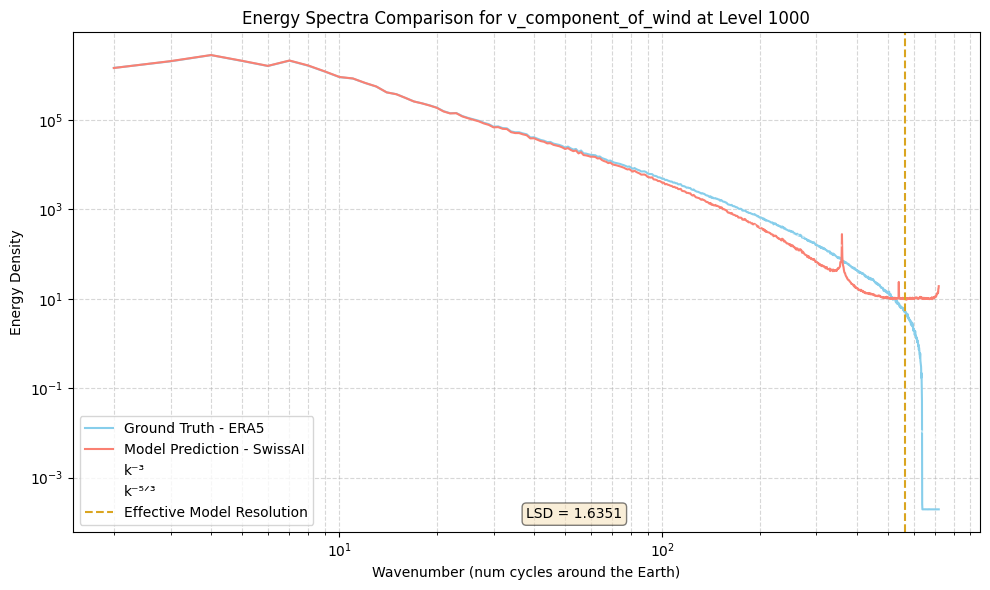

In [11]:
# %%script echo skipping
# For 3D variables
for var in VARIABLES_3D:
    for level in LEVELS:
        fig, ax = plot_energy_spectra(ds, ds_ml, var, level=level)
        plt.show()

In [ ]:
def display_lsd_table(ds, ds_ml, variables, levels):
    """
    Display a table with LSD metrics for variables as columns and height as rows.
    Text coloring:
    - Green: LSD < 1 (Good similarity)
    - Orange: 1 ≤ LSD < 2 (Moderate differences)
    - Red: LSD ≥ 2 (Significant differences)
    """
    # Create and populate DataFrame as before
    lsd_data = {var: [] for var in variables}

    for level in sorted(levels):
        for var in variables:
            if var in ds and var in ds_ml:
                var_data = ds[var].sel(level=level)
                var_data_ml = ds_ml[var].sel(level=level)

                _, spectrum_ds, _ = calculate_energy_spectra(var_data)
                _, spectrum_ds_ml, _ = calculate_energy_spectra(var_data_ml)

                lsd = calculate_log_spectral_distance(
                    spectrum_ds, spectrum_ds_ml
                )
                lsd_data[var].append(lsd)

    df = pd.DataFrame(lsd_data, index=sorted(levels))
    df.index.name = "Height Level"

    # Define the color styling function
    def color_lsd(val):
        if val < 1:
            color = "green"
        elif val < 2:
            color = "orange"
        else:
            color = "red"
        return f"color: {color}"

    # Apply styling and display
    styled_df = df.style.format("{:.3f}").map(color_lsd)

    display(styled_df)


display_lsd_table(ds, ds_ml, VARIABLES_3D, LEVELS)

/tmp/ipykernel_263925/2149735764.py:40: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  styled_df = df.style.format("{:.3f}").applymap(color_lsd)


,geopotential,specific_humidity,temperature,u_component_of_wind,v_component_of_wind
Height Level,,,,,
50,1.527,0.011,2.150,2.157,2.188
100,1.299,0.043,1.844,1.719,1.941
150,1.184,0.269,1.703,1.593,1.643
200,1.165,0.512,1.659,1.552,1.638
250,1.174,0.531,1.583,1.488,1.526
300,1.216,0.493,1.553,1.526,1.551
400,1.164,0.471,1.466,1.554,1.604
500,1.093,0.449,1.408,1.506,1.536
600,1.043,0.458,1.427,1.478,1.499


### 5. Vertical Profiles

In this chapter, the focus is on assessing how the relative error between the ML
model and ERA5 data varies with altitude across different latitude bands.
Vertical profiles are essential for understanding the atmospheric structure and
processes at different pressure levels. Obviously these plots only work for 3D
variables.

**Relative Error Calculation:** Using percentage differences provides a
normalized measure of error that is comparable across variables and pressure
levels.

**Latitude Band Analysis:** As with previous chapters, examining different
latitude bands acknowledges the variability in atmospheric conditions around the
globe.

**Altitude-Specific Insights:** The plots reveal whether the ML model performs
consistently across different altitudes or if certain layers pose challenges.

**Atmospheric Dynamics:** Accurate representation of vertical profiles is
crucial for modeling phenomena like convection or the jet stream.

**Pressure Level Interpretation:** Lower pressure levels correspond to higher
altitudes. Inverted axes help represent this correctly but can be
counterintuitive.

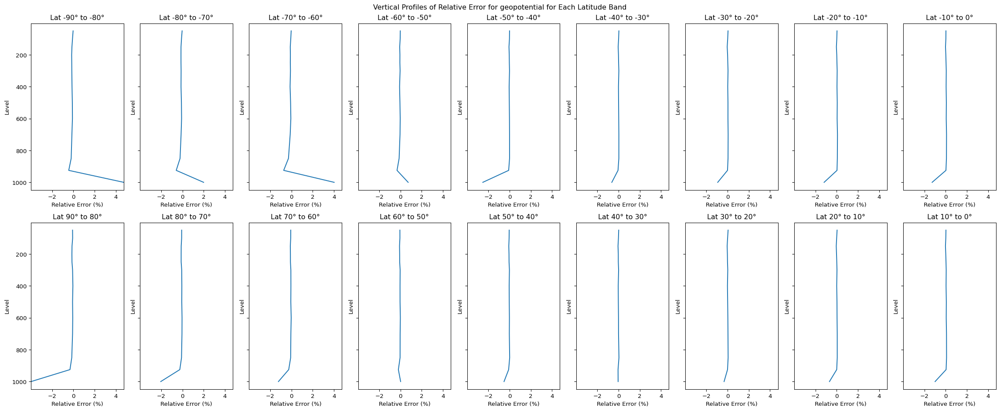

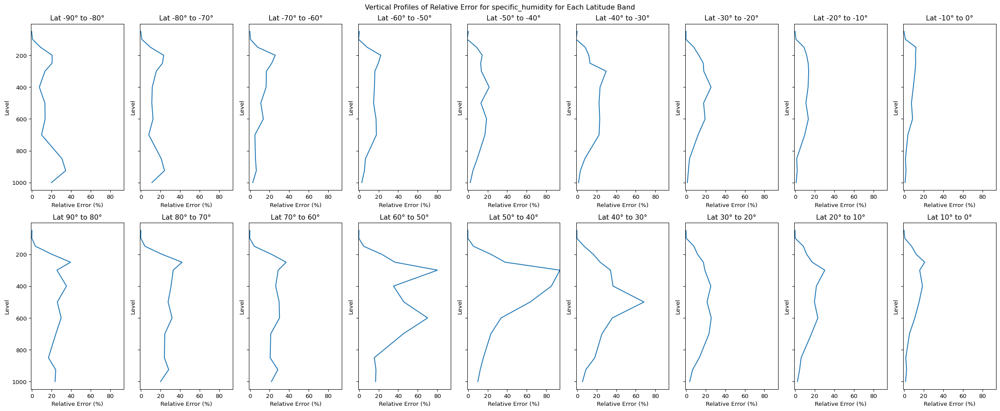

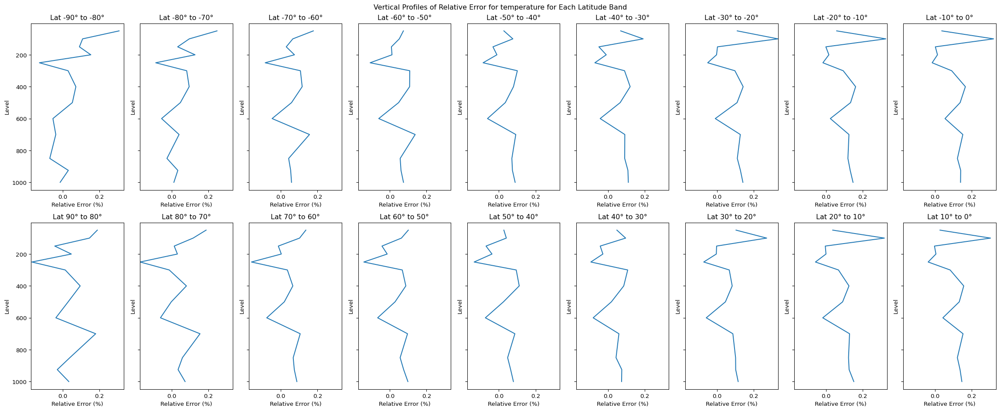

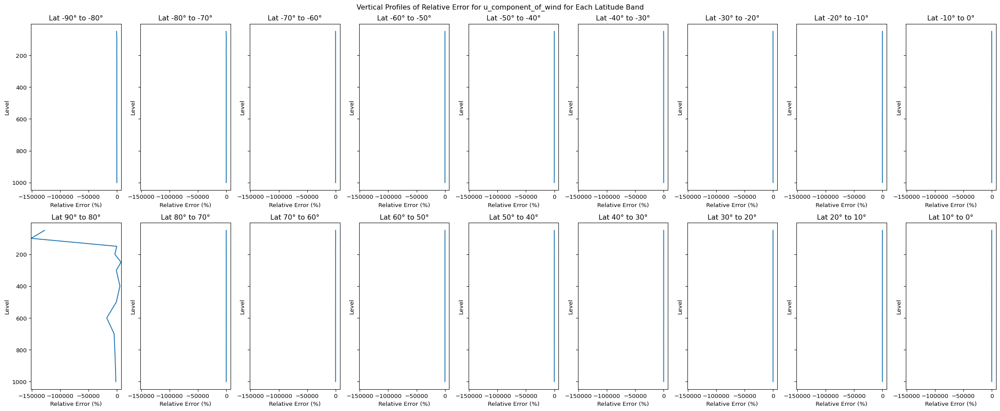

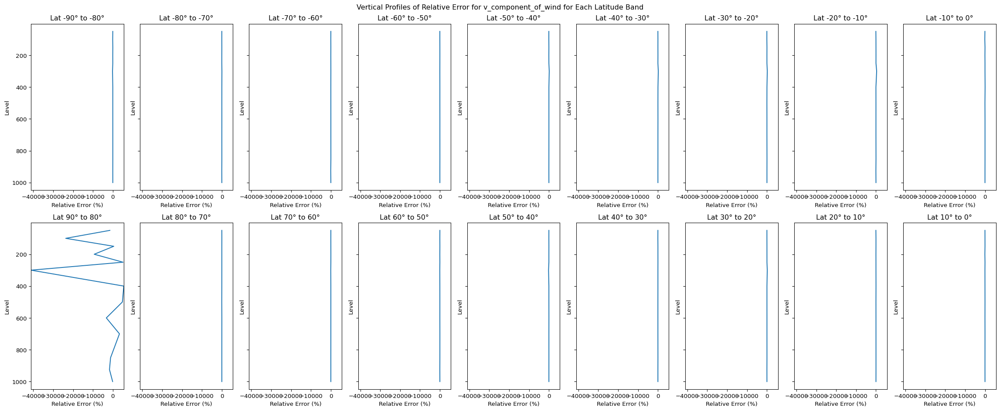

In [56]:
n_cols = 2

for var in VARIABLES_3D:
    fig, axes = plt.subplots(
        n_cols, n_bands // 2, figsize=(24, 10), dpi=DPI * 2, sharey=True
    )

    # Calculate global xmin and xmax
    global_min = float("inf")
    global_max = float("-inf")

    for i in range(n_bands // 2):
        # Negative latitudes
        lat_min_neg = lat_bins[i]
        lat_max_neg = lat_bins[i + 1]
        lat_slice_neg = slice(lat_max_neg, lat_min_neg)
        data_ds_neg = ds[var].sel(latitude=lat_slice_neg)
        data_ds_ml_neg = ds_ml[var].sel(latitude=lat_slice_neg)
        relative_error_neg = (
            (data_ds_ml_neg - data_ds_neg) / data_ds_neg
        ).mean(dim=["time", "latitude", "longitude"], skipna=True) * 100

        finite_mask = np.isfinite(relative_error_neg)
        if finite_mask.any():
            global_min = min(
                global_min,
                float(relative_error_neg.where(finite_mask).min().item()),
            )
            global_max = max(
                global_max,
                float(relative_error_neg.where(finite_mask).max().item()),
            )

        # Positive latitudes
        idx = -(i + 1)
        lat_min_pos = lat_bins[idx]
        lat_max_pos = lat_bins[idx - 1]
        lat_slice_pos = slice(lat_min_pos, lat_max_pos)
        data_ds_pos = ds[var].sel(latitude=lat_slice_pos)
        data_ds_ml_pos = ds_ml[var].sel(latitude=lat_slice_pos)
        relative_error_pos = (
            (data_ds_ml_pos - data_ds_pos) / data_ds_pos
        ).mean(dim=["time", "latitude", "longitude"], skipna=True) * 100

        global_min = min(global_min, float(relative_error_pos.min().item()))
        global_max = max(global_max, float(relative_error_pos.max().item()))

    for i in range(n_bands // 2):
        # Negative latitudes (first row)
        lat_min_neg = lat_bins[i]
        lat_max_neg = lat_bins[i + 1]
        lat_slice_neg = slice(lat_max_neg, lat_min_neg)
        ax_neg = axes[0, i]
        data_ds_neg = ds[var].sel(latitude=lat_slice_neg)
        data_ds_ml_neg = ds_ml[var].sel(latitude=lat_slice_neg)
        relative_error_neg = (
            (data_ds_ml_neg - data_ds_neg) / data_ds_neg
        ).mean(dim=["time", "latitude", "longitude"], skipna=True) * 100

        # Plot only finite values
        ax_neg.plot(relative_error_neg, LEVELS)
        ax_neg.set_title(f"Lat {lat_min_neg}° to {lat_max_neg}°")
        ax_neg.set_xlabel("Relative Error (%)")
        ax_neg.set_ylabel("Level")
        ax_neg.invert_yaxis()
        ax_neg.set_xlim(global_min, global_max)

        # Positive latitudes (second row)
        idx = -(i + 1)
        lat_min_pos = lat_bins[idx]
        lat_max_pos = lat_bins[idx - 1]
        lat_slice_pos = slice(lat_min_pos, lat_max_pos)
        ax_pos = axes[1, i]
        data_ds_pos = ds[var].sel(latitude=lat_slice_pos)
        data_ds_ml_pos = ds_ml[var].sel(latitude=lat_slice_pos)
        relative_error_pos = (
            (data_ds_ml_pos - data_ds_pos) / data_ds_pos
        ).mean(dim=["time", "latitude", "longitude"], skipna=True) * 100

        ax_pos.plot(relative_error_pos, LEVELS)
        ax_pos.set_title(f"Lat {lat_min_pos}° to {lat_max_pos}°")
        ax_pos.set_xlabel("Relative Error (%)")
        ax_pos.set_ylabel("Level")
        ax_pos.invert_yaxis()
        ax_pos.set_xlim(global_min, global_max)

    plt.gca().invert_yaxis()
    plt.suptitle(
        f"Vertical Profiles of Relative Error for {var} for Each Latitude Band"
    )
    plt.tight_layout()
    plt.show()

### 6. Various Verification Metrics

The final chapter consolidates various statistical metrics to provide a broad
evaluation of the ML model's performance. By considering multiple metrics, we
gain a nuanced understanding of both the strengths and weaknesses of the model.

**Metric Diversity:** Including MAE, RMSE, MSE, Pearson correlation, and the
Fractions Skill Score (FSS) covers different aspects of model performance, from
average errors to spatial pattern accuracy.

**MAE, MSE and RMSE:** Offer insights into the average magnitude of errors, with
RMSE emphasizing larger discrepancies. The colors indicating high errors are
only implemented for these three metrics with standardization.

**Pearson Correlation:** Assesses the linear relationship, indicating whether
the model captures variability even if biases exist.

**FSS:** Evaluates spatial accuracy, which is particularly important for
predicting localized weather events.

**Wasserstein Distance:** Provides a holistic view of distributional similarity
across variables. Same as chapter 3.

**Standardization of Data:** Standardizing variables ensures that metrics are
not dominated by variables with larger magnitudes, allowing for fair
comparisons.

**Holistic Assessment:** The combination of metrics provides a comprehensive
performance profile, essential for model validation and comparison.

In [57]:
max_spatial_dim = max(ds.longitude.size, ds.latitude.size)
window_size = (max_spatial_dim // 100,) * 2
n_points = min(10000000, ds[VARIABLES_2D[0]].size)
print(f"Using window size: {window_size}")
print(f"Using n_points: {n_points}")

Using window size: (14, 14)
Using n_points: 10000000


In [58]:
def calculate_all_metrics(ds, ds_ml, calc_relative=True):
    """Calculate a set of metrics for each variable in the given datasets."""
    variables = list(ds.data_vars)
    metrics_dict = {}

    for var in variables:
        print(f"Calculating metrics for variable: {var}")
        y_true = ds[var]
        y_pred = ds_ml[var]

        sample = np.random.choice(
            y_true.values.ravel(), n_points, replace=False
        )
        quantile_90 = np.quantile(sample, 0.90)

        # Calculate norms and mean absolute value
        l1_norm = np.sum(np.abs(y_true.values))
        l2_norm = np.sqrt(np.sum(y_true.values**2))
        mean_abs = np.mean(np.abs(y_true.values))

        # Calculate metrics
        mae_val = mae(y_true, y_pred)
        rmse_val = rmse(y_true, y_pred)

        metrics_dict[var] = {
            "MAE": mae_val,
            "RMSE": rmse_val,
            "MSE": mse(y_true, y_pred),
            "Relative MAE": mae_val / mean_abs,  # Added relative MAE
            "Pearson R": pearsonr(y_true, y_pred),
            "FSS": fss_2d(
                y_pred,
                y_true,
                event_threshold=quantile_90,
                window_size=window_size,
                spatial_dims=["latitude", "longitude"],
            ),
            "Wasserstein": wasserstein_distance(
                y_true.values.flatten(), y_pred.values.flatten()
            ),
        }

        if calc_relative:
            metrics_dict[var].update({
                "Relative L1": mae_val / l1_norm,
                "Relative L2": rmse_val / l2_norm,
            })

    # Create DataFrame with desired column order
    cols = [
        "MAE",
        "RMSE",
        "MSE",
        "Relative MAE",  # Added to column list
        "Relative L1",
        "Relative L2",
        "Pearson R",
        "FSS",
    ]

    cols_stdized = [
        "MAE",
        "RMSE",
        "MSE",
        "Relative MAE",
        "Wasserstein",
    ]  # Added to standardized columns

    df = pd.DataFrame.from_dict(metrics_dict, orient="index")
    if calc_relative:
        return df[cols]
    return df[cols_stdized]


# Calculate metrics
regular_metrics = calculate_all_metrics(ds, ds_ml, calc_relative=True)
standardized_metrics = calculate_all_metrics(
    ds_standardized, ds_ml_standardized, calc_relative=False
)
standardized_metrics.columns = [
    f"{col} (Stdized)" for col in standardized_metrics.columns
]

formatters = {
    "MAE": "{:.4f}",
    "RMSE": "{:.4f}",
    "MSE": "{:.4f}",
    "Relative MAE": "{:.4f}",
    "Relative L1": "{:.3e}",
    "Relative L2": "{:.3e}",
    "Pearson R": "{:.4f}",
    "FSS": "{:.4f}",
    "Wasserstein": "{:.4f}",
    # Add standardized versions
    "MAE (Stdized)": "{:.4f}",
    "RMSE (Stdized)": "{:.4f}",
    "MSE (Stdized)": "{:.4f}",
    "Relative MAE (Stdized)": "{:.4f}",
    "Wasserstein (Stdized)": "{:.4f}",
}
print("Regular Metrics:")
display(regular_metrics.style.format(formatters))
print("\nStandardized Metrics:")
display(standardized_metrics.style.format(formatters))

Calculating metrics for variable: 10m_u_component_of_wind
Calculating metrics for variable: 10m_v_component_of_wind
Calculating metrics for variable: 2m_temperature
Calculating metrics for variable: mean_sea_level_pressure
Calculating metrics for variable: geopotential
Calculating metrics for variable: specific_humidity
Calculating metrics for variable: temperature
Calculating metrics for variable: u_component_of_wind
Calculating metrics for variable: v_component_of_wind
Calculating metrics for variable: 10m_u_component_of_wind
Calculating metrics for variable: 10m_v_component_of_wind
Calculating metrics for variable: 2m_temperature
Calculating metrics for variable: mean_sea_level_pressure
Calculating metrics for variable: geopotential
Calculating metrics for variable: specific_humidity
Calculating metrics for variable: temperature
Calculating metrics for variable: u_component_of_wind
Calculating metrics for variable: v_component_of_wind
Regular Metrics:


,MAE,RMSE,MSE,Relative MAE,Relative L1,Relative L2,Pearson R,FSS
10m_u_component_of_wind,0.3176,0.4562,0.2081,0.0713,6.881e-09,2.508e-05,0.9967,0.9960
10m_v_component_of_wind,0.3364,0.4761,0.2267,0.0978,9.432e-09,3.323e-05,0.9945,0.9904
2m_temperature,0.3656,0.5756,0.3314,0.0013,1.272e-10,6.431e-07,0.9996,0.9902
mean_sea_level_pressure,38.3504,47.2963,2236.9373,0.0004,3.663e-11,1.455e-07,0.9997,0.9949
geopotential,51.1514,72.3855,5239.6641,0.0007,4.878e-12,6.366e-08,1.0000,0.9996
specific_humidity,0.0001,0.0002,0.0000,0.0539,3.997e-10,4.610e-06,0.9984,0.9973
temperature,0.3550,0.4717,0.2225,0.0015,1.082e-11,1.659e-07,0.9999,0.9940
u_component_of_wind,0.7794,1.0721,1.1494,0.0694,5.150e-10,5.690e-06,0.9974,0.9941
v_component_of_wind,0.7026,0.9830,0.9664,0.1125,8.349e-10,9.577e-06,0.9939,0.9874



Standardized Metrics:


,MAE (Stdized),RMSE (Stdized),MSE (Stdized),Relative MAE (Stdized),Wasserstein (Stdized)
10m_u_component_of_wind,0.0574,0.0824,0.0068,0.0715,0.0020
10m_v_component_of_wind,0.0774,0.1095,0.0120,0.0979,0.0197
2m_temperature,0.0158,0.0249,0.0006,0.0213,0.0032
mean_sea_level_pressure,0.0072,0.0089,0.0001,0.0339,0.0052
geopotential,0.0009,0.0013,0.0000,0.0010,0.0007
specific_humidity,0.0279,0.0637,0.0041,0.0397,0.0146
temperature,0.0039,0.0052,0.0000,0.0146,0.0017
u_component_of_wind,0.0679,0.0934,0.0087,0.0703,0.0185
v_component_of_wind,0.1045,0.1462,0.0214,0.1125,0.0082


### Equitable Skill Score
Range: -1/3 to 1, where:
- 1 = perfect score
- 0 = no skill compared to random chance
- Negative values = worse than random chance

**Key Properties:**
- ETS measures how well predicted events correspond to observed events, accounting for hits due to random chance
- It's particularly useful for rare events (like precipitation above a high threshold)
- It's more equitable than the simple Threat Score because it accounts for hits that would occur by chance

**Advantages:**
- More meaningful than simple accuracy for rare events
- Penalizes both misses and false alarms
- Accounts for random chance, making it more robust than basic threat scores

In [59]:
def calculate_ets_for_thresholds(ds, ds_ml, thresholds):
    """Calculate ETS metrics for each variable and threshold in the given datasets."""
    variables = list(ds.data_vars)
    metrics_dict = {}

    for var in variables:
        y_true = ds[var]
        y_pred = ds_ml[var]

        metrics_dict[var] = {}

        for threshold in thresholds:
            # Calculate quantile
            quantile = np.quantile(y_true, threshold / 100.0)

            # Create binary events
            obs_events = y_true >= quantile
            fcst_events = y_pred >= quantile

            # Create binary contingency manager
            bcm = BinaryContingencyManager(
                fcst_events=fcst_events, obs_events=obs_events
            )

            # Transform to get basic contingency manager (reducing all dimensions)
            basic_cm = bcm.transform(reduce_dims="all")

            # Calculate Equitable Threat Score
            ets_score = basic_cm.equitable_threat_score()

            metrics_dict[var][f"ETS {threshold}%"] = float(ets_score.values)

    # Create DataFrame
    df = pd.DataFrame.from_dict(metrics_dict, orient="index")

    # Define formatters
    formatters = {f"ETS {threshold}%": "{:.4f}" for threshold in thresholds}

    # Apply color formatting based on skill level
    def color_skill_level(val):
        score = float(val)
        if score >= 0.7:
            color = "green"
        elif score >= 0.5:
            color = "blue"
        elif score >= 0.3:
            color = "orange"
        else:
            color = "red"
        return f"color: {color}"

    print("\nEquitable Threat Score Metrics:")
    return df.style.format(formatters).map(color_skill_level)


# Define thresholds
thresholds = [50, 60, 70, 80, 90]

# Calculate and display metrics
ets_metrics = calculate_ets_for_thresholds(ds, ds_ml, thresholds)
display(ets_metrics)


Equitable Threat Score Metrics:


,ETS 50%,ETS 60%,ETS 70%,ETS 80%,ETS 90%
10m_u_component_of_wind,0.8972,0.9004,0.9135,0.9250,0.9170
10m_v_component_of_wind,0.8660,0.8728,0.8813,0.8795,0.8668
2m_temperature,0.9867,0.9835,0.9736,0.9469,0.8556
mean_sea_level_pressure,0.9216,0.9313,0.9408,0.9377,0.9439
geopotential,0.9995,0.9927,0.9931,0.9977,0.9960
specific_humidity,0.9190,0.8865,0.9258,0.9475,0.9510
temperature,0.9897,0.9885,0.9871,0.9852,0.9583
u_component_of_wind,0.9116,0.9213,0.9266,0.9286,0.9223
v_component_of_wind,0.8418,0.8481,0.8578,0.8658,0.8697
